# ポートフォリオ「電力消費量予測 モデル化」（仲本 夏生）

## 0.0 アウトライン

この分析では、電力消費量に影響を与える要因を可視化・検証し、予測モデルの構築に役立てることを目的とする。
分析を可視化とモデル化の2つのパートに分け、モデル化パートでは、モデル選択のためにデータの特徴を把握し、実装を進めていきたい。<br/><br/>
**可視化**
1. 背景・目的
2. 仮説立て
3. 仮説の検証
----------------
**モデル化（本ファイル）**
1. 特徴確認
2. モデル化1 古典的時系列分析モデル
3. モデル化2 Prophetモデル
4. モデル化3 決定木系モデル 
5. まとめ

## 1.0 特徴確認

- モデル選択を行うにあたり、まずはデータセットの特徴を確認する。ここからは、データ統合および必要な前処理が完了しているデータセットを使用する。
- また、事前の分析に基づき、新たに以下の説明変数を追加している。
    - temperature_abs: 電力消費量が減少すると仮定した閾値「18.2℃」を基準とした、気温の絶対値差分。（詳細な作成方法については後述の補足を参照）
- データセットの内容

| 項目              | 種類         | 単位                  | 説明                                                                                   |
|-------------------|--------------|-----------------------|---------------------------------------------------------------------------------------|
| 目的変数 (y)      | 量的変数     | 10MW                  | 電力消費量                                                                             |
| 説明変数 (x)      |              |                       |                                                                                       |
| - temperature     | 量的変数     | 摂氏 (°C)             | 気温                                                                                   |
| - temperature_abs | 量的変数     | 摂氏 (°C)             | 電力消費量が減少する閾値18.2度を基準とした絶対値差分                                     |
| - is_holiday      | 質的変数     | 1: 休日, 0: 平日      | 土日祝日および祝日の振替休日が「1」、平日が「0」としてフラグ付けされた変数                                             |

### 1.1 データセットの用意

In [1]:
# 必要なライブラリのインポート
import warnings

import chardet  # エンコーディングを自動的に推測する
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
from matplotlib import pyplot as plt

warnings.simplefilter("ignore")
from matplotlib import rcParams

rcParams["font.family"] = "sans-serif"
rcParams["font.sans-serif"] = "Meiryo"
pd.set_option("display.unicode.east_asian_width", True)

In [2]:
# CSVデータの読み込み
data = pd.read_csv("data.csv")
data

,DATETIME,10MW,temperature,temperature_abs,is_holiday
0,2016/4/1 0:00,2555,14.5,3.6,0
1,2016/4/1 1:00,2433,13.3,4.8,0
2,2016/4/1 2:00,2393,13.8,4.3,0
3,2016/4/1 3:00,2375,13.0,5.1,0
4,2016/4/1 4:00,2390,12.2,5.9,0
...,...,...,...,...,...
67939,2023/12/31 19:00,2919,9.6,8.5,1
67940,2023/12/31 20:00,2845,11.4,6.7,1
67941,2023/12/31 21:00,2754,11.0,7.1,1
67942,2023/12/31 22:00,2647,9.5,8.6,1


In [3]:
# DATETIME 列をインデックスに設定
data.set_index(
    "DATETIME", inplace=True
)  # inplace=True(元のデータフレームをその場で変更) の場合、再代入は不要
# インデックスを datetime 型に変換
data.index = pd.to_datetime(data.index)

In [4]:
# インデックスに頻度を設定
data = data.asfreq("h")  # 'h' は毎時データ
data.head()

,10MW,temperature,temperature_abs,is_holiday
DATETIME,,,,
2016-04-01 00:00:00,2555,14.5,3.6,0
2016-04-01 01:00:00,2433,13.3,4.8,0
2016-04-01 02:00:00,2393,13.8,4.3,0
2016-04-01 03:00:00,2375,13.0,5.1,0
2016-04-01 04:00:00,2390,12.2,5.9,0


### 補足：temperature_absの閾値の決め方、作成方法

In [5]:
# 気温ごとに電力消費量の平均を計算
data_copy = data.copy() # 実際はtemprature_absを作成後、data.csvとしている
temp_avg_consumption = data_copy.groupby("temperature")["10MW"].mean().reset_index()
temp_avg_consumption.head()

,temperature,10MW
0,-3.6,4270.0
1,-3.5,4631.0
2,-3.2,4270.0
3,-3.1,4206.0
4,-3.0,3720.0


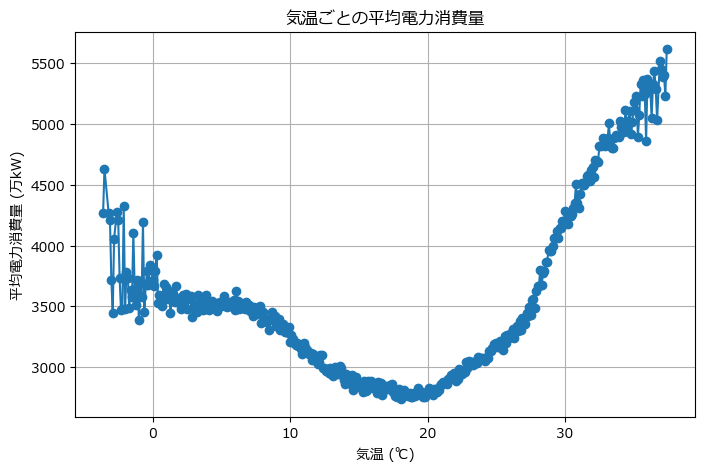

電力消費量が最も低くなる気温: 18.1°C


In [6]:
# 気温と電力消費量の関係をプロット
plt.figure(figsize=(8, 5))
plt.plot(temp_avg_consumption['temperature'], temp_avg_consumption['10MW'], marker="o")
plt.xlabel("気温 (℃)")
plt.ylabel("平均電力消費量 (万kW)")
plt.title("気温ごとの平均電力消費量")
plt.grid()
plt.show()

# 最小値の特定
min_temp = temp_avg_consumption.loc[temp_avg_consumption['10MW'].idxmin(), 'temperature']
print(f"電力消費量が最も低くなる気温: {min_temp}°C")

In [7]:
# 閾値を設定（18.1°C）
threshold = 18.1

# temperature_absを絶対差分として計算
data_copy["temperature_abs"] = (data_copy['temperature'] - threshold).abs()
data_copy.head()

,10MW,temperature,temperature_abs,is_holiday
DATETIME,,,,
2016-04-01 00:00:00,2555,14.5,3.6,0
2016-04-01 01:00:00,2433,13.3,4.8,0
2016-04-01 02:00:00,2393,13.8,4.3,0
2016-04-01 03:00:00,2375,13.0,5.1,0
2016-04-01 04:00:00,2390,12.2,5.9,0


In [8]:
# 絶対値をとった気温と電力消費量の相関係数を計算
correlation = data_copy[["temperature_abs", "10MW"]].corr()
correlation

,temperature_abs,10MW
temperature_abs,1.000000,0.549049
10MW,0.549049,1.000000


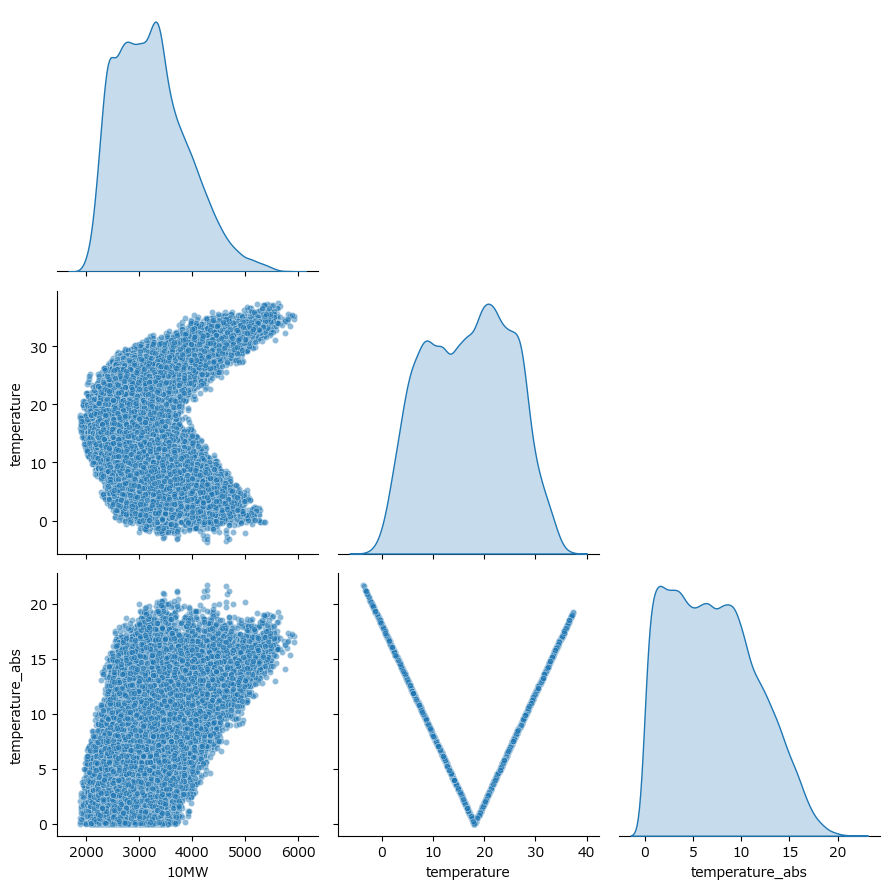

In [9]:
# 散布図をかいて関係性を可視化
g = sns.pairplot(
    data_copy[['10MW', 'temperature', 'temperature_abs']],
    diag_kind='kde',          # 対角線方向をKDEで滑らかに表示
    corner=True,              # 上三角か下三角のみ表示
    height=3.0,               # 各グラフセルの縦横サイズ
    plot_kws={'alpha':0.5, 's':20},  # 散布図の透過度とマーカーサイズを指定
    palette='Blues'           # カラーパレット
)

plt.tight_layout()  # レイアウト調整
plt.show()

- もとの気温と電力消費量の関係は、非対称で非線形な関係であったが、閾値からの絶対値差分を取ることで、より明確な関係を捉えることができた。
- モデル化に際し、本特徴量を使うことといたしたい。

### 1.2 STL分解

- モデル選択のためにSTL分解を実施する
- STL分解（LOESS平滑化を利用した分解）とは、時系列データを季節性（seasonal）、トレンド（trend）、そして残差（remainder）の成分に分解するものである。
- 特徴として、柔軟性が高く、任意の周期性を持つデータに対して適用可能である点が挙げられ、トレンドや季節性の形状が時間とともに変化するデータに対しても強力なことが挙げられる。

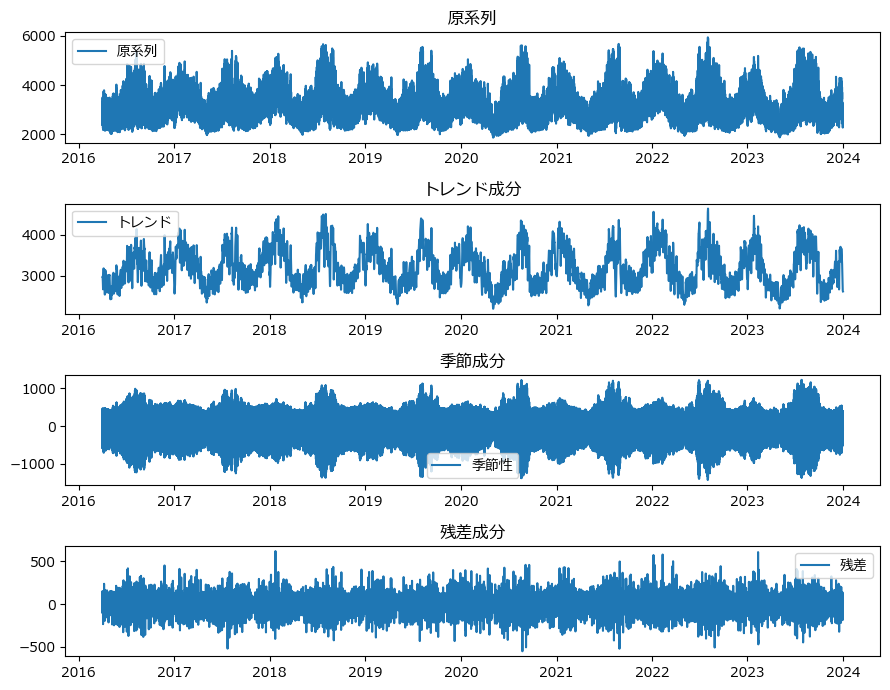

In [10]:
from statsmodels.tsa.seasonal import STL

# STL分解の実行
stl = STL(data["10MW"], period=24)
result = stl.fit()
# 分解された成分の取得
trend = result.trend
seasonal = result.seasonal
resid = result.resid
# 結果の可視化
plt.figure(figsize=(9, 7))
plt.subplot(411)
plt.plot(data["10MW"], label="原系列")
plt.legend(loc="best")
plt.title("原系列")
plt.subplot(412)
plt.plot(trend, label="トレンド")
plt.legend(loc="best")
plt.title("トレンド成分")
plt.subplot(413)
plt.plot(seasonal, label="季節性")
plt.legend(loc="best")
plt.title("季節成分")
plt.subplot(414)
plt.plot(resid, label="残差")
plt.legend(loc="best")
plt.title("残差成分")
plt.tight_layout()
plt.show()

- 残差の変動が大きいことが分かる
- 周期を24時間から1週間（168時間）に変更してみる

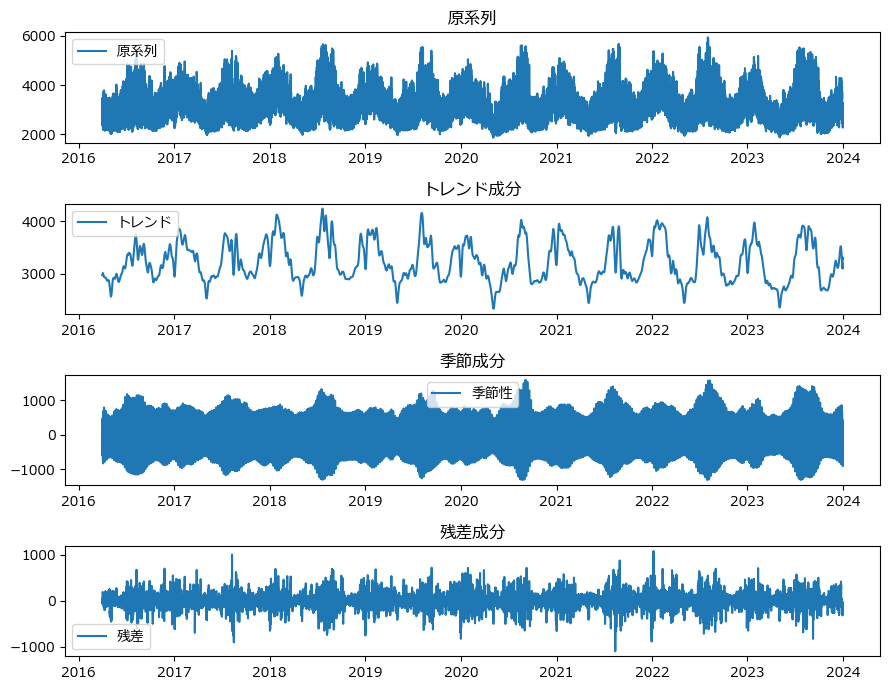

In [11]:
from statsmodels.tsa.seasonal import STL

# STL分解の実行
stl = STL(data["10MW"], period=168)  # 周期を168に変更
result = stl.fit()
# 分解された成分の取得
trend = result.trend
seasonal = result.seasonal
resid = result.resid
# 結果の可視化
plt.figure(figsize=(9, 7))
plt.subplot(411)
plt.plot(data["10MW"], label="原系列")
plt.legend(loc="best")
plt.title("原系列")
plt.subplot(412)
plt.plot(trend, label="トレンド")
plt.legend(loc="best")
plt.title("トレンド成分")
plt.subplot(413)
plt.plot(seasonal, label="季節性")
plt.legend(loc="best")
plt.title("季節成分")
plt.subplot(414)
plt.plot(resid, label="残差")
plt.legend(loc="best")
plt.title("残差成分")
plt.tight_layout()
plt.show()

**STL分析の解釈**
- トレンド成分
    - 上昇または下降はなく一年を通して同じ周期が繰り返されている
- 季節成分
    - 波の形状があり、周期性が繰り返されている ⇒ 季節性が存在すると言える
- 残差成分
    - period=24に比べて、period=168のほうが少ないように見える

### 1.3 定常性の確認

- 時系列データにおいて、予測モデルの適用にはそのデータが「定常性」を持つかどうかが重要となる。
    - 定常性とは、時系列の統計的特性（平均、分散、自己共分散など）が時間に依存せず一定であることを意味する。
- 定常かどうかを確認する方法の1つに、拡張ディッキー–フラー検定（ADF検定、augmented Dickey–Fuller test）という統計的仮説検定手法がある。
- 本検定は以下の仮説に基づき、データが定常性を持つかどうかを検証する。
    - 帰無仮説H0：時系列は非定常である（単位根をもつ）
    - 対立仮説H1：時系列は定常である（単位根をもたない）
- 本分析では、時系列モデルの適用に先立ち、データが定常性を持つかどうかをADF検定を用いて確認する。この結果に基づき、必要に応じて前処理を施すことで、モデルの精度向上を目指す。

In [12]:
# ADF検定
from statsmodels.tsa.stattools import adfuller

result = adfuller(data["10MW"])
print(f"ADF Statistic: {result[0]}")
print(f"p-value: {result[1]}")

ADF Statistic: -12.421451294785046
p-value: 4.128223989478911e-23


- ADF統計量が非常に小さい値（負の方向に大きい）であり、データが強い定常性を示している
- p値が極めて小さい（通常の閾値である0.05を大幅に下回る）ため、帰無仮説（非定常性の仮説）を棄却できる<br/>
⇒ このデータは少なくともランダムウォーク的な非定常性はないと確認した

### 1.4 自己相関係数（ACF）と偏自己相関係数（PACF）

- 自己相関係数（ACF）や偏自己相関係数（PACF）を分析する。これにより、ARモデルやMAモデルの次数を決定できる。

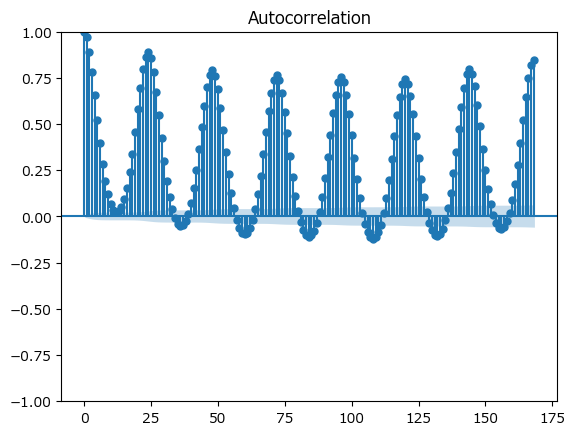

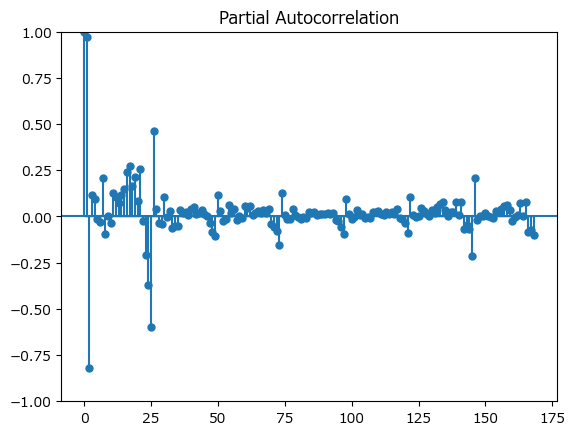

In [13]:
import statsmodels.api as sm

y = data["10MW"]
fig_1 = sm.graphics.tsa.plot_acf(y, lags=168)
fig_2 = sm.graphics.tsa.plot_pacf(y, lags=168)

**結果の解釈**
- ACF（自己相関係数）
    - 周期的なピーク
        - ラグ24ごと（1日）とラグ168（1週間）の間隔で明確なピークが繰り返されている。電力消費量に日単位や週単位の周期性が強く影響していることを示唆する。
    - 減衰
        - ACFが急激に0に近づかないため、単純なMAモデル（移動平均モデル）では十分に説明できない可能性がある。
- PACF（偏自己相関関数）
    - ピーク
        - 最初のラグ（特にラグ1）で大きなピークが観測される。 これは自己回帰（AR）の成分がデータの構造に影響していることを示唆する。
    - 減衰
        - 通常、PACFは何らかの次数（p次）まで顕著な相関があり、その後ほぼ0近くで推移する場合、ARモデルで捉えられる。しかしここでは、はっきりした打ち切りパターンが見えず、不規則に上下しているように見えるため、単純なARモデルでは適合しにくい可能性がある。

### 1.4 特徴把握まとめ

- 本データは、ACFやPACFから明らかなように、日周期（24時間）・週周期（168時間）など複数の周期が重なっている可能性が高い。また、非線形な関係（気温と電力消費量の関係）が存在する。
- 古典的時系列分析として、ARIMAや単純なARモデルは、特定の周期や非線形性には強くない。SARIMAは1つの季節性（周期）をモデル化できるが、複数の周期が明確に絡む場合や非線形要因が強い場合は限界がある（パラメータの設定ができない）。
- 一方で、Prophetは強力な非線形関数（ガンマ関数やシグモイド関数）でトレンドや季節性を表現し、自動的に複雑なパターンにフィットしやすい。
- また、ツリー系モデル（勾配ブースティング、LightGBM）はif-thenルールの集積的な構造により、非線形かつ複雑な関係を柔軟にモデル化できる。
- よって以下のとおりモデル化を進めたい。
    - 古典的時系列分析モデル
        - AR（完全に捨て去る前に簡易的に試行する）
    - Prophetモデル
    - 決定木系モデル
        - ランダムフォレスト
        - ヒスト勾配ブースティング回帰木
        - LightGBM
- 評価指標として、以下2種を採用したい
    - RMSE（MSEの場合、大きくなりすぎて比較が難しい可能性があるため）
    - R2乗決定係数

## 2.0 モデル化1 古典的時系列分析モデル

### 2.1 AR（自己回帰）モデル

- 電力消費量の過去の値を使って現在の値を予測するモデルである。

In [14]:
y = data["10MW"]
X = data[["temperature", "temperature_abs", "is_holiday"]]

In [15]:
print(y.isnull().sum())  # 欠損値の数を確認
print(np.isinf(y).sum())  # 無限値の数を確認

0
0


In [16]:
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.ar_model import AutoReg

# データの分割
y_train = y["2016-04-01":"2022-12-31"]
y_test = y["2023-01-01":"2023-12-31"]

# ARモデルの構築とフィッティング
p = 168
ar_model = AutoReg(y_train, lags=p, old_names=False)
ar_model_fit = ar_model.fit()

# モデルのサマリー
print(ar_model_fit.summary())

                            AutoReg Model Results                             
Dep. Variable:                   10MW   No. Observations:                59184
Model:                   AutoReg(168)   Log Likelihood             -300680.892
Method:               Conditional MLE   S.D. of innovations             39.487
Date:                Tue, 17 Dec 2024   AIC                         601701.784
Time:                        10:07:24   BIC                         603229.330
Sample:                    04-08-2016   HQIC                        602176.622
                         - 12-31-2022                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.3893      1.422      5.195      0.000       4.602      10.177
10MW.L1        1.5676      0.004    382.801      0.000       1.560       1.576
10MW.L2       -0.5623      0.008    -73.661      0.0

In [17]:
# 予測の実施
y_pred = ar_model_fit.predict(start=len(y_train), end=len(y_train) + len(y_test) - 1)
# テストデータとの比較
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")
r2 = r2_score(y_test, y_pred)
print(f'R-Squared: {r2}')

Root Mean Squared Error (RMSE): 639.2685024217292
R-Squared: 0.19376456870270375


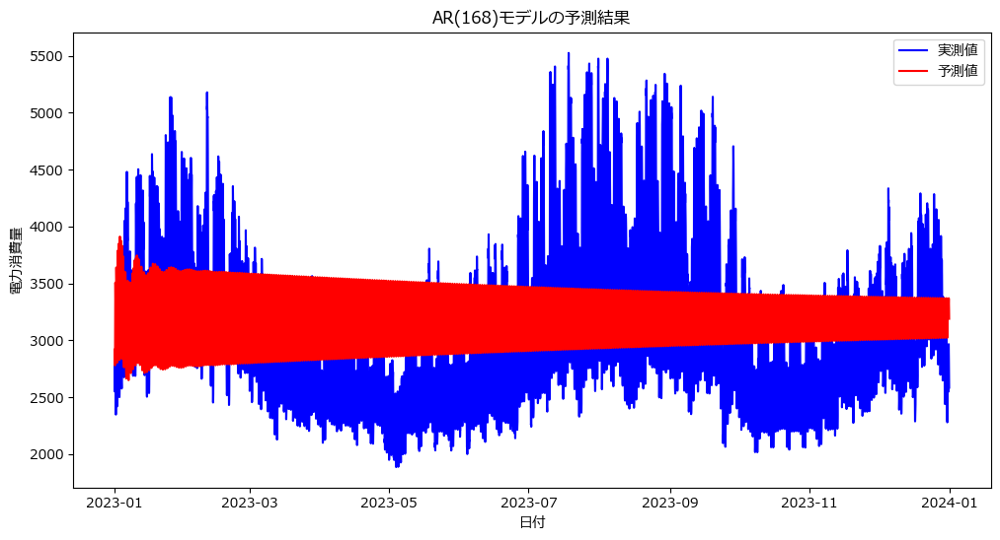

In [18]:
# 結果のプロット
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label="実測値", color="blue")
plt.plot(y_test.index, y_pred, label="予測値", color="red")
plt.xlabel("日付")
plt.ylabel("電力消費量")
plt.title(f"AR({p})モデルの予測結果")
plt.legend()
plt.show()

- 一期前、二期前の値から将来を推定することを試みたが、結果として複雑な変動は復元できず一定値へと収束していることが分かる
- ここから、STL分解によるトレンド・季節性成分の抽出することで、定常性に近いデータを作り出すことを試行する

選択されたラグ数: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
STL分解モデル - RMSE: 615.935
STL分解モデル - R²: 0.252


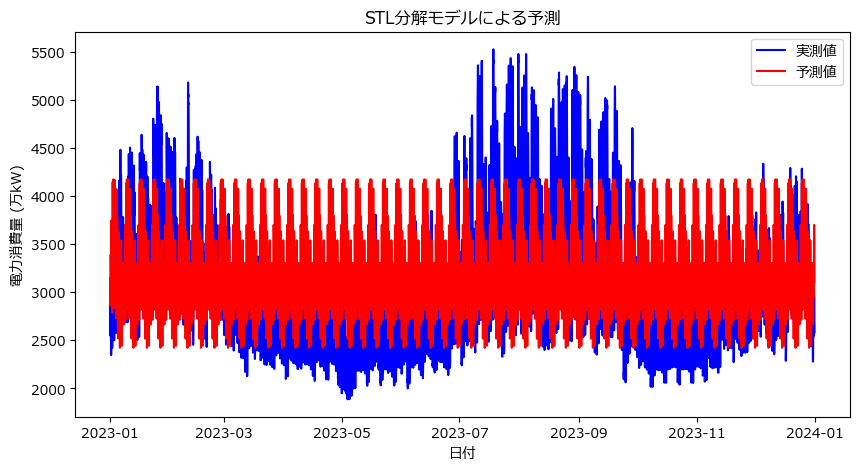

In [19]:
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.ar_model import AutoReg, ar_select_order
from sklearn.metrics import mean_squared_error, r2_score

# 訓練データとテストデータの分割
train_data = data['2016-04-01':'2022-12-31']
test_data = data['2023-01-01':'2023-12-31']

# STL分解
stl = STL(train_data['10MW'], period=168)  # 週単位の周期性
result = stl.fit()

# 残差を取得
train_data['residual'] = train_data['10MW'] - result.trend - result.seasonal

# テストデータに対して外挿
test_trend = np.tile(result.trend[-168:], len(test_data) // 168 + 1)[:len(test_data)]
test_seasonal = np.tile(result.seasonal[-168:], len(test_data) // 168 + 1)[:len(test_data)]
test_residual = test_data['10MW'] - test_trend - test_seasonal

# 学習用データ
y_train = train_data['residual']

# ラグ選択とモデルの学習
sel = ar_select_order(y_train, maxlag=24, old_names=False)
selected_lags = sel.ar_lags
print(f"選択されたラグ数: {selected_lags}")

ar_model = AutoReg(y_train, lags=selected_lags)
ar_model_fit = ar_model.fit()

# テストデータの予測
y_pred = ar_model_fit.predict(start=len(y_train), end=len(y_train) + len(test_residual) - 1)

# 予測値を元のスケールに再構築
y_pred_final = y_pred + test_trend + test_seasonal

# 評価指標の計算
rmse = np.sqrt(mean_squared_error(test_data['10MW'], y_pred_final))
r2 = r2_score(test_data['10MW'], y_pred_final)

print(f'STL分解モデル - RMSE: {rmse:.3f}')
print(f'STL分解モデル - R²: {r2:.3f}')

# 可視化
plt.figure(figsize=(10, 5))
plt.plot(test_data.index, test_data['10MW'], label='実測値', color='blue')
plt.plot(test_data.index, y_pred_final, label='予測値', color='red')
plt.xlabel('日付')
plt.ylabel('電力消費量 (万kW)')
plt.title('STL分解モデルによる予測')
plt.legend()
plt.show()

- 今回、STL分解による季節性の抽出が機能しているため、予測値（赤線）に周期性が明確に現れている
- 一方で、実測値のピークと谷が予測値で反映されていない（トレンドや周期性が安定している場合には効果的）
- 時系列分析モデルで本データを扱うことは難しいと考え、トレンドや季節性を自動的にモデル化してくれるProphetを試したい。

## 3.0 モデル化2 Prophetモデル

### ① 説明変数なし（デフォルト）

In [20]:
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics

In [21]:
# インデックスをリセットして "ds" カラムを作成
data_p = data.reset_index()
data_p.rename(columns={'DATETIME': 'ds', '10MW': 'y'}, inplace=True)
data_prophet = data_p.drop(
    columns=['temperature', 'temperature_abs', 'is_holiday']
)
data_prophet

,ds,y
0,2016-04-01 00:00:00,2555
1,2016-04-01 01:00:00,2433
2,2016-04-01 02:00:00,2393
3,2016-04-01 03:00:00,2375
4,2016-04-01 04:00:00,2390
...,...,...
67939,2023-12-31 19:00:00,2919
67940,2023-12-31 20:00:00,2845
67941,2023-12-31 21:00:00,2754
67942,2023-12-31 22:00:00,2647


In [22]:
# 2016年～2022年までのデータを用いて2023年の電力消費量を予測する
train_data = data_prophet[data_prophet["ds"] <= "2022-12-31 23:00:00"]
test_data = data_prophet[data_prophet["ds"] >= "2023-01-01 00:00:00"]
test_data.reset_index(drop=True, inplace=True)

# 予測モデル構築
model = Prophet()
model.fit(train_data)

10:07:56 - cmdstanpy - INFO - Chain [1] start processing
10:08:31 - cmdstanpy - INFO - Chain [1] done processing


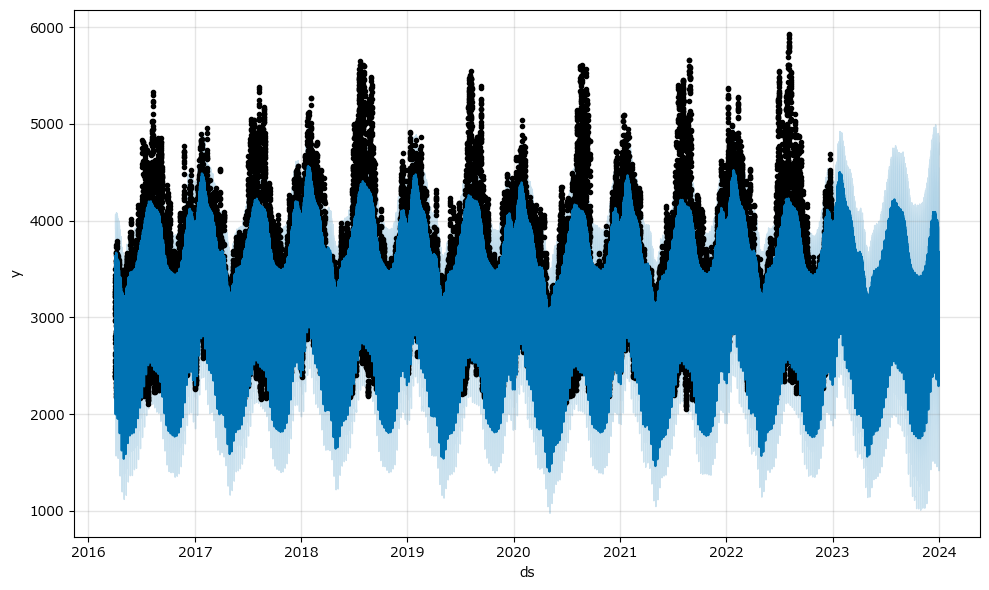

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2023-01-01 00:00:00,3244.575315,2145.171960,2926.691230,3244.575315,3244.575315,-705.381699,-705.381699,-705.381699,-504.450868,...,-349.753053,-349.753053,-349.753053,148.822222,148.822222,148.822222,0.0,0.0,0.0,2539.193616
1,2023-01-01 01:00:00,3244.573751,1996.013768,2814.238872,3244.573751,3244.573751,-835.468879,-835.468879,-835.468879,-625.850191,...,-358.453301,-358.453301,-358.453301,148.834614,148.834614,148.834614,0.0,0.0,0.0,2409.104873
2,2023-01-01 02:00:00,3244.572188,1902.774943,2765.178006,3244.572188,3244.572188,-911.546549,-911.546549,-911.546549,-694.593788,...,-365.805156,-365.805156,-365.805156,148.852395,148.852395,148.852395,0.0,0.0,0.0,2333.025639
3,2023-01-01 03:00:00,3244.570624,1881.616478,2694.227072,3244.570624,3244.570624,-944.425540,-944.425540,-944.425540,-721.552661,...,-371.748462,-371.748462,-371.748462,148.875582,148.875582,148.875582,0.0,0.0,0.0,2300.145083
4,2023-01-01 04:00:00,3244.569060,1913.230317,2733.655737,3244.569060,3244.569060,-927.555399,-927.555399,-927.555399,-700.226890,...,-376.232700,-376.232700,-376.232700,148.904191,148.904191,148.904191,0.0,0.0,0.0,2317.013661
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2023-12-31 19:00:00,3230.883716,2611.130192,4352.019130,2420.483321,4026.013079,259.066335,259.066335,259.066335,376.940240,...,-266.910935,-266.910935,-266.910935,149.037030,149.037030,149.037030,0.0,0.0,0.0,3489.950051
8756,2023-12-31 20:00:00,3230.882153,2470.910801,4318.584322,2420.374019,4026.149656,164.802676,164.802676,164.802676,265.706792,...,-249.895326,-249.895326,-249.895326,148.991210,148.991210,148.991210,0.0,0.0,0.0,3395.684828
8757,2023-12-31 21:00:00,3230.880589,2339.677754,4144.516862,2420.264717,4026.286232,14.426247,14.426247,14.426247,97.624679,...,-232.149029,-232.149029,-232.149029,148.950596,148.950596,148.950596,0.0,0.0,0.0,3245.306836
8758,2023-12-31 22:00:00,3230.879025,2108.705757,3901.658864,2420.155415,4026.422808,-176.851721,-176.851721,-176.851721,-111.980577,...,-213.786351,-213.786351,-213.786351,148.915207,148.915207,148.915207,0.0,0.0,0.0,3054.027304


In [23]:
# 予測のためのデータフレームを作る
length = len(test_data)
future = model.make_future_dataframe(periods=length, freq="H")  # 1時間単位
forecast = model.predict(future)
model.plot(forecast)
plt.show()

# 予測値と実測値の分割
forecast_2023 = forecast[forecast["ds"] >= "2023-01-01"].reset_index(drop=True)
forecast_2023

In [24]:
# 予測する2023年のデータを抜き出し
data_2023 = data_prophet[data_prophet["ds"] >= "2023-01-01"].reset_index(drop=True)
# 性能評価するために実測値と予測値を同じデータフレームにいれる
result = pd.DataFrame()
result = pd.merge(data_2023, forecast_2023, on=["ds"])
result = result[["ds", "y", "yhat"]]

# 実測値-予測値
result["diff"] = result["y"] - result["yhat"]

# 精度指標
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error

def performance(result, y_col="y", yhat_col="yhat"):
    mse = mean_squared_error(result[y_col], result[yhat_col])
    rmse = np.sqrt(mse)
    r2 = r2_score(result[y_col], result[yhat_col])
    return {'RMSE': rmse, 'R2 Score': r2}

# パフォーマンス計算
metrics = performance(result)
# 結果を表示
print(f"RMSE: {metrics['RMSE']}")
print(f"R^2 Score: {metrics['R2 Score']}")

RMSE: 374.3116179963274
R^2 Score: 0.7235848256882131


- ARモデルよりに比べ、よい性能が出ている

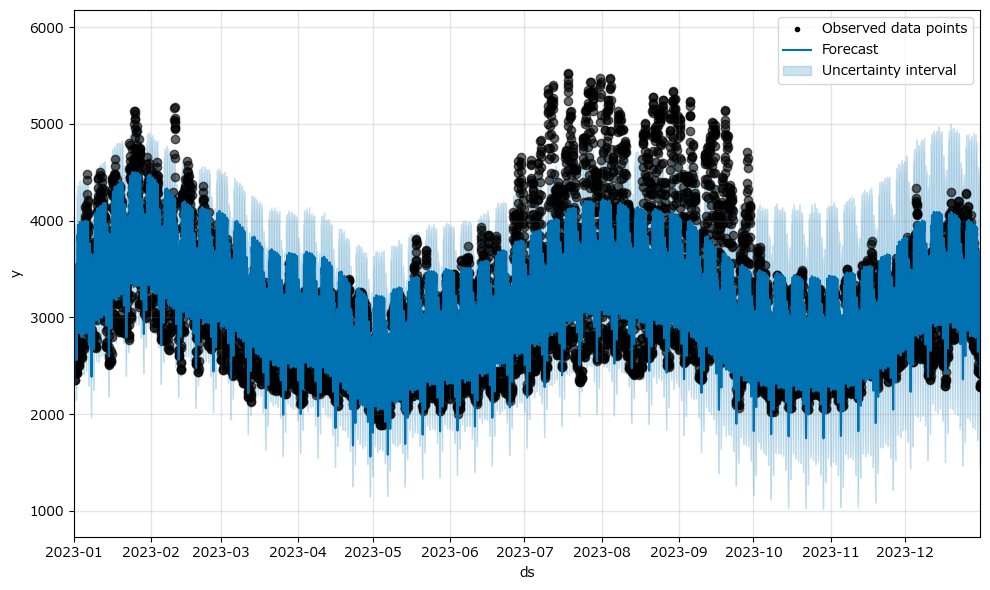

In [25]:
import datetime as dt

# Prophetのデフォルトプロット
fig = model.plot(forecast, include_legend=True)

# 実測値（2023年）を散布図で追加
plt.scatter(
    data_2023["ds"], data_2023["y"], color="black", label="実測値（2023年）", alpha=0.6
)
# グラフ範囲を設定（2023年のデータのみ表示）
plt.xlim([dt.datetime(2023, 1, 1), dt.datetime(2023, 12, 31)])
plt.show()

- おおまかな周期性を読み取ってはいるが、季節性により消費電力が大きくなるところは予測できていない

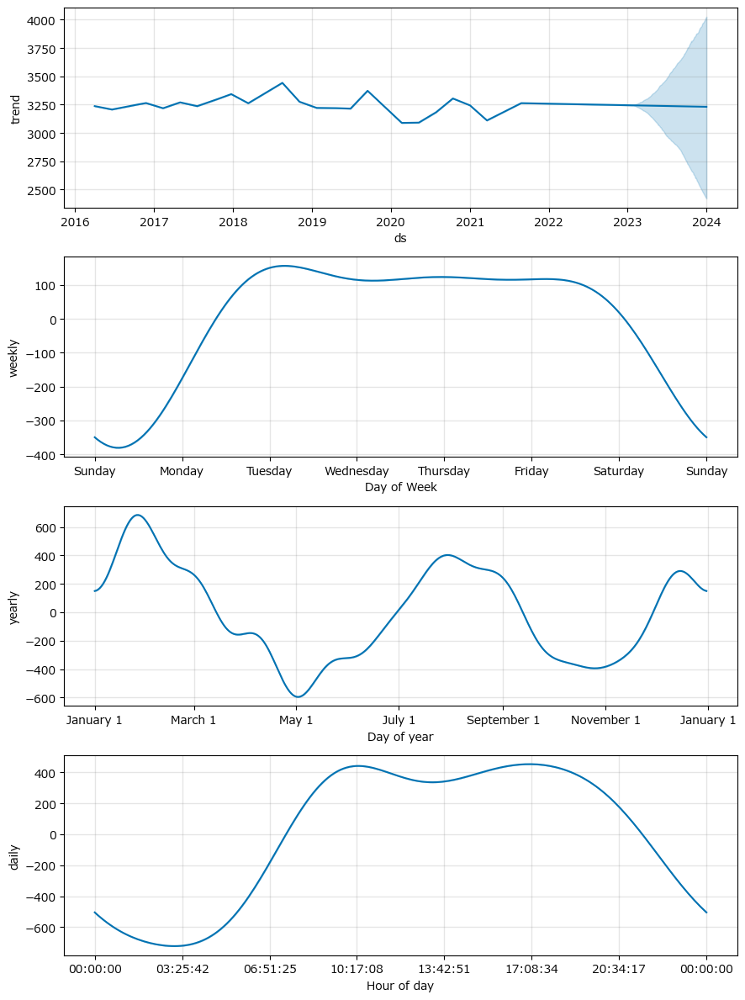

In [26]:
# 予測結果の各成分をプロット
fig_components = model.plot_components(forecast)
# グラフ表示
plt.show()

- 年、週、日ごとの周期性が確認できるため、デフォルトのハイパーパラメータの設定はしなくてもよいことが分かる（daily_seasonalityはデフォルトではFalseだが、このグラフを見ると読み取っていることが分かる）

### ② 説明変数に休日

- Prophetでは引数に追加する方法もあるが、今回は説明変数として追加したい（他の変数との相互作用を考慮でき、外部要因の影響を直接分析できるため）。

In [27]:
holiday = pd.DataFrame(data_p[["ds", "is_holiday"]])
holiday.rename(columns={"is_holiday": "holiday"}, inplace=True)
train_data_holiday = pd.merge(train_data, holiday, on="ds")
train_data_holiday

,ds,y,holiday
0,2016-04-01 00:00:00,2555,0
1,2016-04-01 01:00:00,2433,0
2,2016-04-01 02:00:00,2393,0
3,2016-04-01 03:00:00,2375,0
4,2016-04-01 04:00:00,2390,0
...,...,...,...
59179,2022-12-31 19:00:00,3354,1
59180,2022-12-31 20:00:00,3293,1
59181,2022-12-31 21:00:00,3206,1
59182,2022-12-31 22:00:00,3092,1


10:08:54 - cmdstanpy - INFO - Chain [1] start processing
10:09:45 - cmdstanpy - INFO - Chain [1] done processing


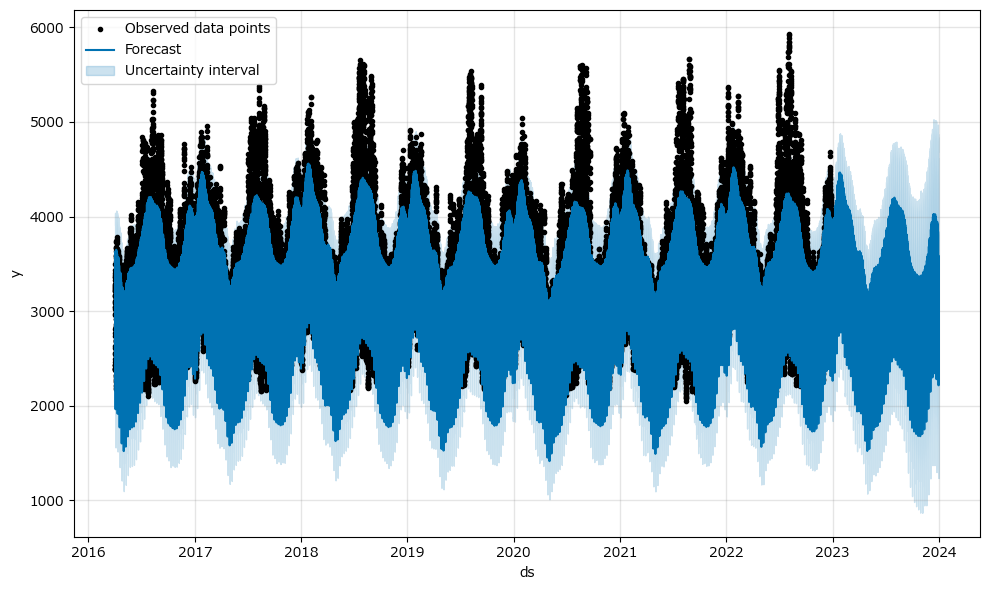

In [28]:
# Prophetモデルの作成
model = Prophet()
model.add_regressor("holiday")  # holidayを説明変数として追加
model.fit(train_data_holiday)

# 全期間（学習データ＋未来データ）の予測用データフレームを作成
future_holiday = model.make_future_dataframe(length, freq="H")
future_holiday = pd.merge(
    future_holiday, holiday, on="ds", how="left"
)  # 休日フラグを追加
forecast_holiday = model.predict(future_holiday)

# 予測結果を確認
model.plot(forecast_holiday, include_legend=True)
plt.show()

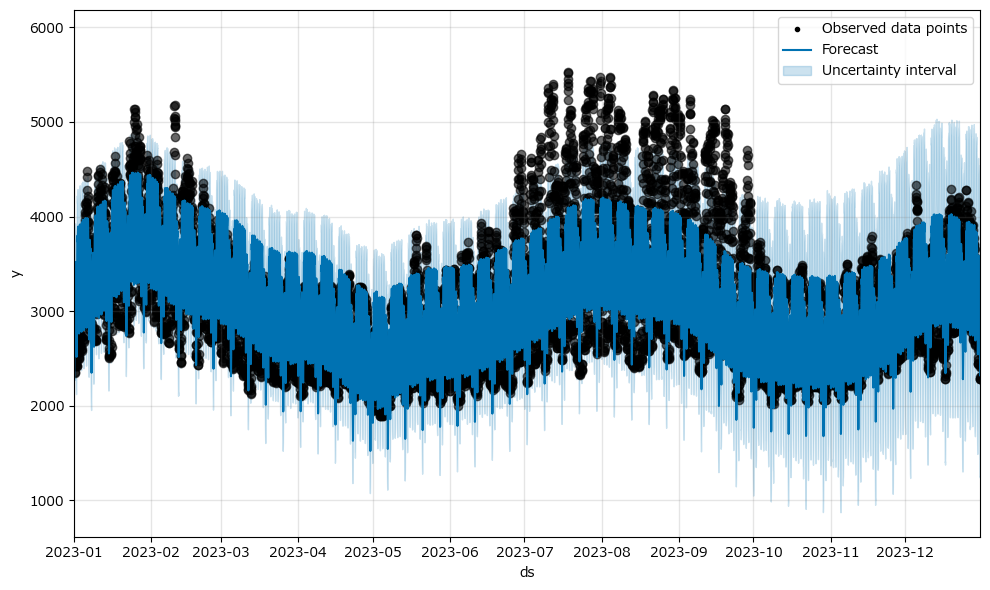

In [29]:
import datetime as dt

# Prophetのデフォルトプロット
fig = model.plot(forecast_holiday, include_legend=True)

# 実測値（2023年）を散布図で追加
plt.scatter(
    data_2023["ds"], data_2023["y"], color="black", label="実測値（2023年）", alpha=0.6
)

# グラフ範囲を設定（2023年のデータのみ表示）
plt.xlim([dt.datetime(2023, 1, 1), dt.datetime(2023, 12, 31)])
plt.show()

In [30]:
# 性能評価するために実測値と予測値を同じデータフレームにいれる
result_1 = pd.DataFrame()
result_1 = pd.merge(data_2023, forecast_holiday, on="ds")
result_1 = result_1[["ds", "y", "yhat"]]
result_1["diff"] = result_1["y"] - result_1["yhat"]
result_1.head()

,ds,y,yhat,diff
0,2023-01-01 00:00:00,2870,2499.946777,370.053223
1,2023-01-01 01:00:00,2721,2371.359326,349.640674
2,2023-01-01 02:00:00,2636,2296.730344,339.269656
3,2023-01-01 03:00:00,2575,2265.238827,309.761173
4,2023-01-01 04:00:00,2548,2283.425251,264.574749


In [31]:
# 精度指標
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error
metrics = performance(result_1)
print(f"RMSE: {metrics['RMSE']}")
print(f"R^2 Score: {metrics['R2 Score']}")

RMSE: 365.9962325843968
R^2 Score: 0.7357296155491726


- 予測性能が若干改善した。
- 次に気温を変数に追加して比較したい。

### ③ 説明変数に休日

In [32]:
temperature = pd.DataFrame(data_p[["ds", "temperature"]])
print(temperature.isnull().sum())  # 欠損値の数を確認 → 4

ds             0
temperature    4
dtype: int64


In [33]:
temperature['temperature'].ffill(inplace=True)
print(temperature.isnull().sum())  # 欠損値の数を確認 → 0

ds             0
temperature    0
dtype: int64


10:10:07 - cmdstanpy - INFO - Chain [1] start processing
10:11:18 - cmdstanpy - INFO - Chain [1] done processing


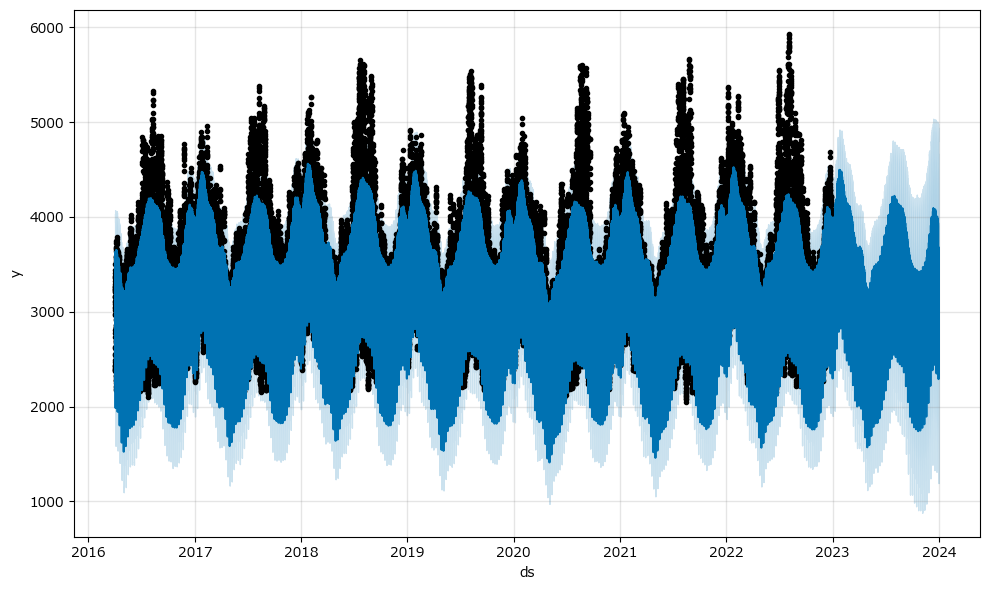

In [34]:
train_data_temperature = pd.merge(train_data, temperature, on="ds")

# Prophetモデルの作成
model = Prophet()
model.add_regressor("temperature")  # temperatureを説明変数として追加
model.fit(train_data_temperature)

# 全期間（学習データ＋未来データ）の予測用データフレームを作成
future_temperature = model.make_future_dataframe(length, freq="H")
future_temperature = pd.merge(future_temperature, temperature, on="ds", how="left")
forecast_temperature = model.predict(future_temperature)

# 予測結果を確認
model.plot(forecast_temperature)
plt.show()

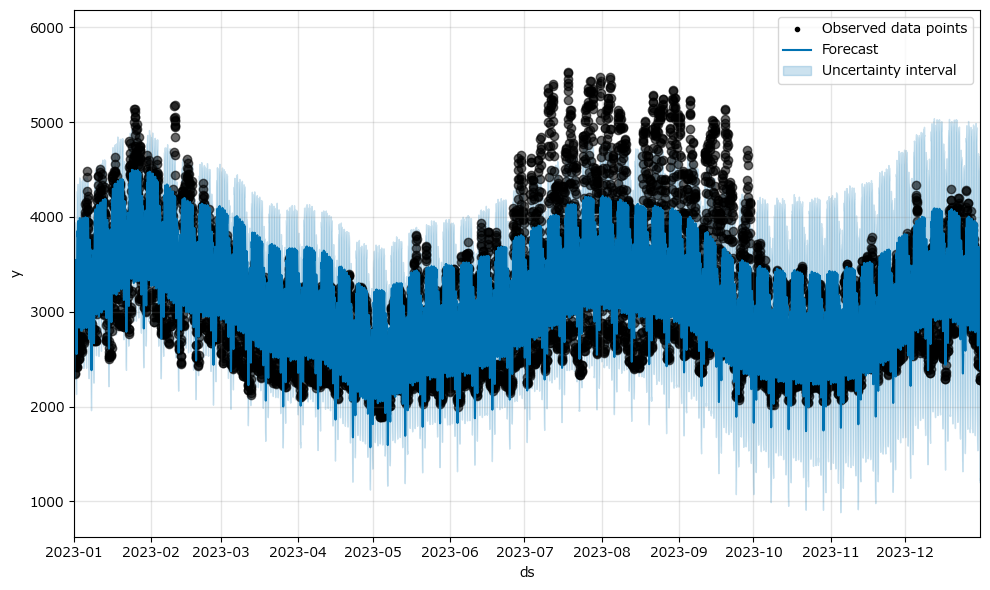

In [35]:
import datetime as dt

# Prophetのデフォルトプロット
fig = model.plot(forecast_temperature, include_legend=True)

# 実測値（2023年）を散布図で追加
plt.scatter(
    data_2023["ds"], data_2023["y"], color="black", label="実測値（2023年）", alpha=0.6
)

# グラフ範囲を設定（2023年のデータのみ表示）
plt.xlim([dt.datetime(2023, 1, 1), dt.datetime(2023, 12, 31)])
plt.show()

In [36]:
# 性能評価するために実測値と予測値を同じデータフレームにいれる
result_2 = pd.DataFrame()
result_2 = pd.merge(data_2023, forecast_temperature, on="ds")
result_2 = result_2[["ds", "y", "yhat"]]
result_2["diff"] = result_2["y"] - result_2["yhat"]
result_2.head()

,ds,y,yhat,diff
0,2023-01-01 00:00:00,2870,2534.856131,335.143869
1,2023-01-01 01:00:00,2721,2404.649316,316.350684
2,2023-01-01 02:00:00,2636,2328.404493,307.595507
3,2023-01-01 03:00:00,2575,2296.389203,278.610797
4,2023-01-01 04:00:00,2548,2313.401922,234.598078


In [37]:
# 精度指標
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error
metrics = performance(result_2)
print(f"RMSE: {metrics['RMSE']}")
print(f"R^2 Score: {metrics['R2 Score']}")

RMSE: 375.8260702034074
R^2 Score: 0.7213435678327789


- 気温を追加すると追加しない場合と比較しても若干精度が低下した。
- 次に、気温と休日の二つの説明変数を合わせてみる。

### ④ 説明変数に休日 + 気温

10:11:39 - cmdstanpy - INFO - Chain [1] start processing
10:12:49 - cmdstanpy - INFO - Chain [1] done processing


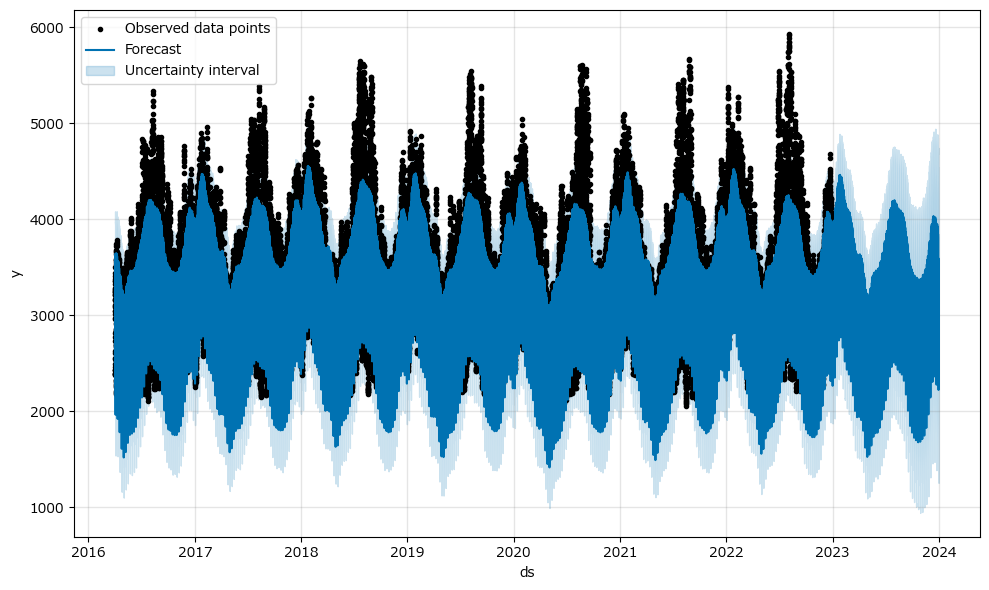

In [38]:
train_data_holi_temp = pd.merge(train_data_holiday, temperature, on="ds")
# Prophetモデルの作成
model = Prophet()
model.add_regressor("holiday")  # 休日フラグを説明変数として追加
model.add_regressor("temperature")  # 気温を説明変数として追加

# モデルの学習
model.fit(train_data_holi_temp)

# 全期間（学習データ＋未来データ）の予測用データフレームを作成
future_holi_temp = model.make_future_dataframe(length, freq="H")
future_holi_temp = pd.merge(future_holi_temp, holiday, on="ds")  # 休日フラグを結合
future_holi_temp = pd.merge(future_holi_temp, temperature, on="ds")  # 気温を結合

# 予測
forecast_holi_temp = model.predict(future_holi_temp)
# 予測結果を確認
model.plot(forecast_holi_temp, include_legend=True)
plt.show()

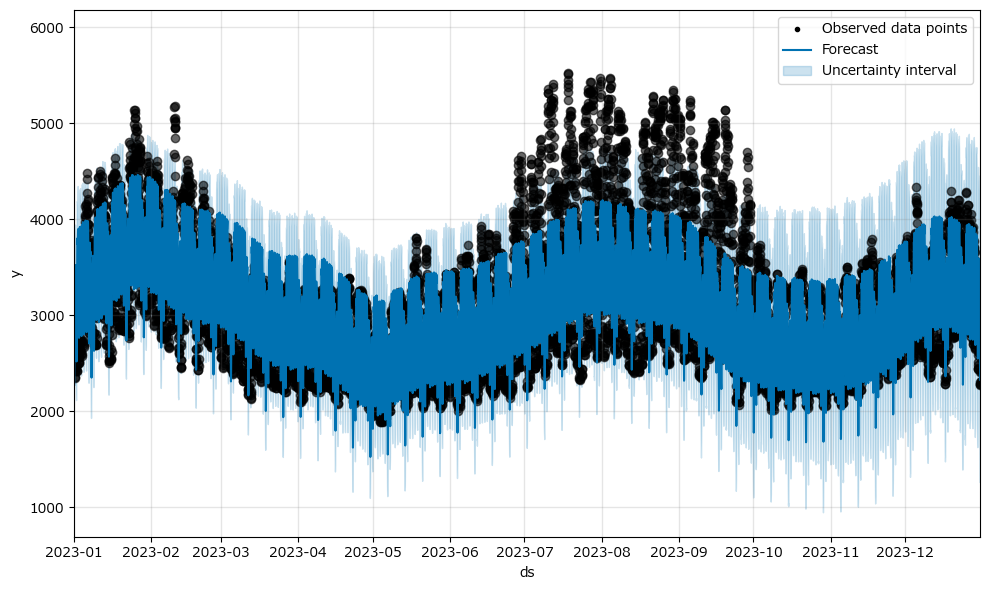

In [39]:
import datetime as dt

# Prophetのデフォルトプロット
fig = model.plot(forecast_holi_temp, include_legend=True)

# 実測値（2023年）を散布図で追加
plt.scatter(
    data_2023["ds"], data_2023["y"], color="black", label="実測値（2023年）", alpha=0.6
)

# グラフ範囲を設定（2023年のデータのみ表示）
plt.xlim([dt.datetime(2023, 1, 1), dt.datetime(2023, 12, 31)])
plt.show()

In [40]:
# 性能評価するために実測値と予測値を同じデータフレームにいれる
result_3 = pd.DataFrame()
result_3 = pd.merge(data_2023, forecast_holi_temp, on="ds")
result_3 = result_3[["ds", "y", "yhat"]]
result_3["diff"] = result_3["y"] - result_3["yhat"]
result_3.head()

,ds,y,yhat,diff
0,2023-01-01 00:00:00,2870,2500.827533,369.172467
1,2023-01-01 01:00:00,2721,2372.113691,348.886309
2,2023-01-01 02:00:00,2636,2297.313254,338.686746
3,2023-01-01 03:00:00,2575,2266.649492,308.350508
4,2023-01-01 04:00:00,2548,2284.965700,263.034300


In [41]:
# 精度指標
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error
metrics = performance(result_3)
print(f"RMSE: {metrics['RMSE']}")
print(f"R^2 Score: {metrics['R2 Score']}")

RMSE: 366.07335621576
R^2 Score: 0.735618228396437


- 何も追加しないよりは性能が上がったが、気温の変化をとらえきれていない。ここから**気温の説明変数**を工夫してみたい。

### ⑤ 説明変数に休日 + 気温（18.1度で絶対値差分）

In [42]:
temperature_abs = pd.DataFrame(data_p[["ds", "temperature_abs"]])
print(temperature_abs.isnull().sum())  # 欠損値の数を確認

ds                 0
temperature_abs    4
dtype: int64


In [43]:
temperature_abs['temperature_abs'].ffill(inplace=True)
print(temperature_abs.isnull().sum())  # 欠損値の数を確認
train_data_holi_tempabs = pd.merge(train_data_holiday, temperature_abs, on="ds")
train_data_holi_tempabs

ds                 0
temperature_abs    0
dtype: int64


,ds,y,holiday,temperature_abs
0,2016-04-01 00:00:00,2555,0,3.6
1,2016-04-01 01:00:00,2433,0,4.8
2,2016-04-01 02:00:00,2393,0,4.3
3,2016-04-01 03:00:00,2375,0,5.1
4,2016-04-01 04:00:00,2390,0,5.9
...,...,...,...,...
59179,2022-12-31 19:00:00,3354,1,12.9
59180,2022-12-31 20:00:00,3293,1,12.4
59181,2022-12-31 21:00:00,3206,1,13.2
59182,2022-12-31 22:00:00,3092,1,14.3


In [44]:
# Prophetモデルの作成
model = Prophet()
model.add_regressor("holiday")
model.add_regressor("temperature_abs")
# モデルの学習
model.fit(train_data_holi_tempabs)

10:13:14 - cmdstanpy - INFO - Chain [1] start processing
10:13:59 - cmdstanpy - INFO - Chain [1] done processing


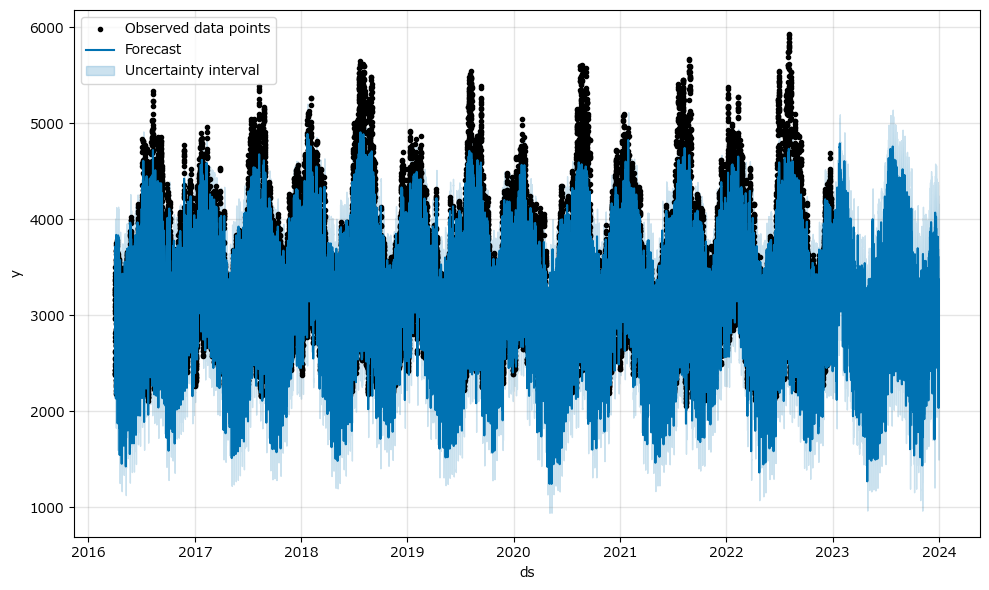

In [45]:
# 全期間（学習データ＋未来データ）の予測用データフレームを作成
future_holi_tempabs = model.make_future_dataframe(length, freq="H")
future_holi_tempabs = pd.merge(future_holiday, temperature_abs, on="ds")
# 予測
forecast_holi_tempabs = model.predict(future_holi_tempabs)
# 予測結果を確認
model.plot(forecast_holi_tempabs, include_legend=True)
plt.show()

In [46]:
# 性能評価するために実測値と予測値を同じデータフレームにいれる
result_4 = pd.DataFrame()
result_4 = pd.merge(data_2023, forecast_holi_tempabs, on="ds")
result_4 = result_4[["ds", "y", "yhat"]]
result_4["diff"] = result_4["y"] - result_4["yhat"]

# 精度指標
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error
metrics = performance(result_4)
print(f"RMSE: {metrics['RMSE']}")
print(f"R^2 Score: {metrics['R2 Score']}")

RMSE: 244.49009989935803
R^2 Score: 0.8820717585003378


- 性能が改善した。さらに閾値での二値化も試してみたい。

### ⑥ 説明変数に休日 + 気温（18.1度で二値化）

In [47]:
# 閾値で二値化フラグ
train_data_holi_hightemp = train_data_holi_temp.copy()
train_data_holi_hightemp["high_temp"] = train_data_holi_hightemp["temperature"].apply(
    lambda x: 1 if x > 18.1 else 0
)
train_data_holi_hightemp.drop(columns="temperature", inplace=True)
train_data_holi_hightemp

,ds,y,holiday,high_temp
0,2016-04-01 00:00:00,2555,0,0
1,2016-04-01 01:00:00,2433,0,0
2,2016-04-01 02:00:00,2393,0,0
3,2016-04-01 03:00:00,2375,0,0
4,2016-04-01 04:00:00,2390,0,0
...,...,...,...,...
59179,2022-12-31 19:00:00,3354,1,0
59180,2022-12-31 20:00:00,3293,1,0
59181,2022-12-31 21:00:00,3206,1,0
59182,2022-12-31 22:00:00,3092,1,0


In [48]:
# Prophetモデルの作成
model = Prophet()
model.add_regressor("holiday")  # 休日フラグを説明変数として追加
model.add_regressor("high_temp")
# モデルの学習
model.fit(train_data_holi_hightemp)

10:14:21 - cmdstanpy - INFO - Chain [1] start processing
10:15:06 - cmdstanpy - INFO - Chain [1] done processing


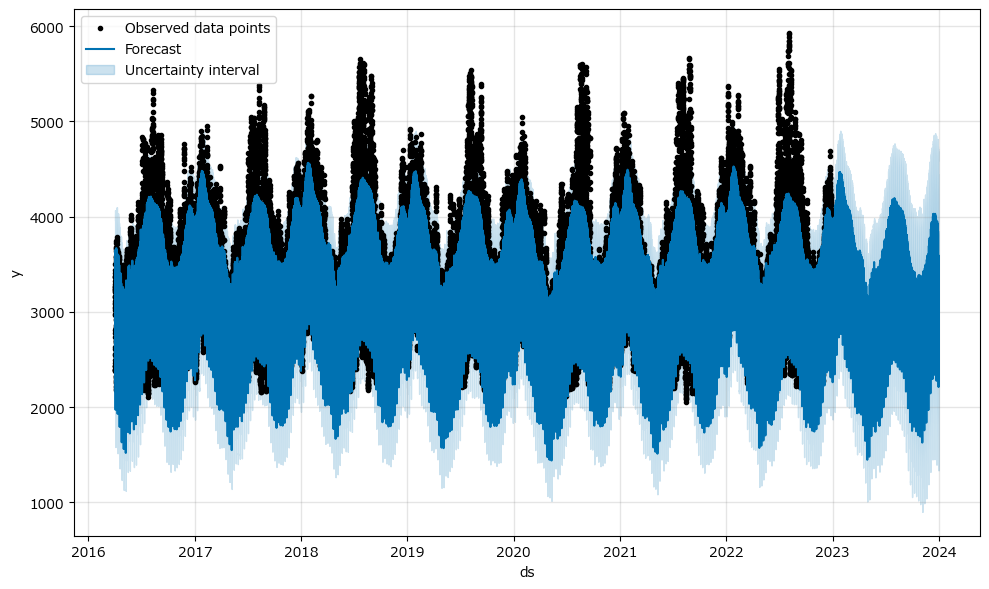

In [49]:
# 全期間（学習データ＋未来データ）の予測用データフレームを作成
future_holi_hightemp = model.make_future_dataframe(length, freq="H")
future_holi_hightemp = pd.merge(future_holi_hightemp, temperature, on="ds")
future_holi_hightemp = pd.merge(future_holi_hightemp, holiday, on="ds")
future_holi_hightemp["high_temp"] = future_holi_hightemp["temperature"].apply(
    lambda x: 1 if x > 18.1 else 0
)
future_holi_hightemp.drop(columns="temperature", inplace=True)

# 予測
forecast_holi_hightemp = model.predict(future_holi_hightemp)
# 予測結果を確認
model.plot(forecast_holi_hightemp, include_legend=True)
plt.show()

In [50]:
# 性能評価するために実測値と予測値を同じデータフレームにいれる
result_5 = pd.DataFrame()
result_5 = pd.merge(data_2023, forecast_holi_hightemp, on="ds")
result_5 = result_5[["ds", "y", "yhat"]]
result_5["diff"] = result_5["y"] - result_5["yhat"]

# 精度指標
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error
metrics = performance(result_5)
print(f"RMSE: {metrics['RMSE']}")
print(f"R^2 Score: {metrics['R2 Score']}")

RMSE: 363.1007979386086
R^2 Score: 0.7398944175817861


- 二値化よりも絶対値差分が有効であると分かった
- 次に絶対値差分のデータの引数を調整して、季節性や説明変数を重視するように変更したい。

### ⑦ 説明変数に休日 + 気温（18.1度で絶対値差分）+ パラメータ調整

In [51]:
# Prophetモデルの作成
model = Prophet(seasonality_mode='multiplicative',  # 乗法的モード
                seasonality_prior_scale=15,         # 季節性を強調（デフォルト10）
                changepoint_prior_scale=0.1         # トレンドの変化点を捉える（デフォルト0.05）
)

# 説明変数を追加（prior_scaleを指定してスケールを調整）
model.add_regressor("holiday", prior_scale=5)  # 休日フラグを重視
model.add_regressor("temperature_abs", prior_scale=5)  # 気温差分を重視

# モデルの学習
model.fit(train_data_holi_tempabs)

10:15:27 - cmdstanpy - INFO - Chain [1] start processing
10:16:32 - cmdstanpy - INFO - Chain [1] done processing


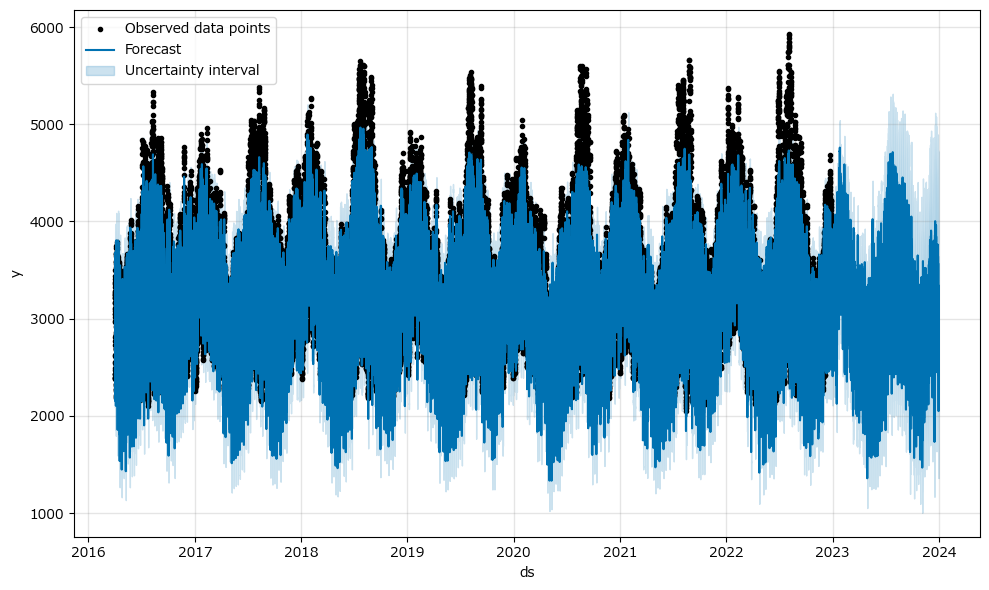

In [52]:
# 全期間（学習データ＋未来データ）の予測用データフレームを作成
future_holi_tempabs = model.make_future_dataframe(length, freq="H")
future_holi_tempabs = pd.merge(future_holiday, temperature_abs, on="ds")
# 予測
forecast_holi_tempabs = model.predict(future_holi_tempabs)
# 予測結果を確認
model.plot(forecast_holi_tempabs, include_legend=True)
plt.show()

In [53]:
# 性能評価するために実測値と予測値を同じデータフレームにいれる
result_6 = pd.DataFrame()
result_6 = pd.merge(data_2023, forecast_holi_tempabs, on="ds")
result_6 = result_6[["ds", "y", "yhat"]]
result_6["diff"] = result_6["y"] - result_6["yhat"]

# 精度指標
from sklearn.metrics import mean_squared_error, r2_score, root_mean_squared_error

def performance(result, y_col="y", yhat_col="yhat"):
    mse = mean_squared_error(result[y_col], result[yhat_col])
    rmse = np.sqrt(mse)
    r2 = r2_score(result[y_col], result[yhat_col])
    return {'RMSE': rmse, 'R2 Score': r2}

metrics = performance(result_6)
print(f"RMSE: {metrics['RMSE']}")
print(f"R^2 Score: {metrics['R2 Score']}")

RMSE: 256.4649786093519
R^2 Score: 0.8702368426715605


- 次に、以下のようにパラメータの設定をし、グリッドサーチを実施した<br/>
```
params = {
    "seasonality_mode": ["additive", "multiplicative"],
    "seasonality_prior_scale": [11, 12, 13],
    "changepoint_prior_scale": [0.05, 0.07, 0.09],
}
```
- 結果として、seasonality_modeは0、seasonality_prior_scaleは11、changepoint_prior_scaleは0.05でrmseが327.441491となったため、調整前の数値が一番性能が良かった
- 最後に一番性能が良かったモデルで予測値と実測値を可視化したい。

### ここまでで一番性能が良かった⑤の結果を可視化

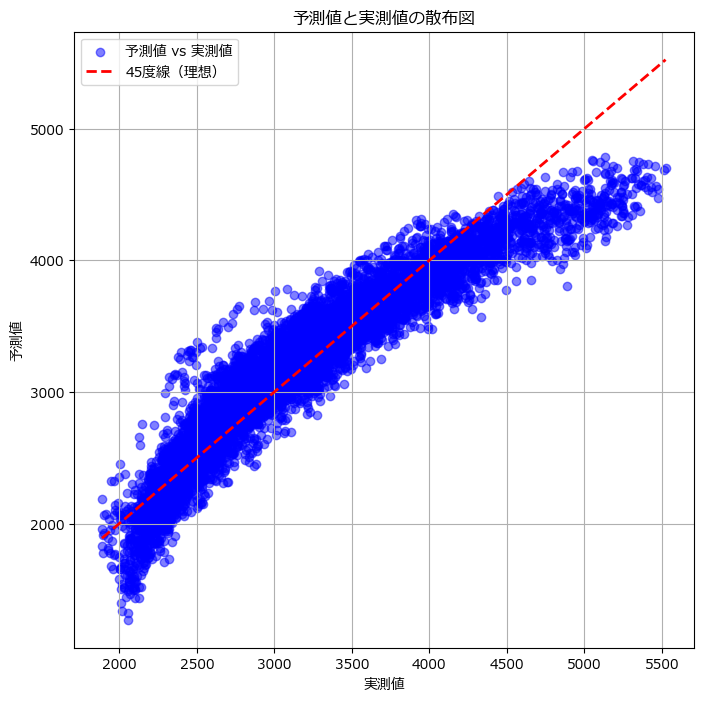

In [54]:
import matplotlib.pyplot as plt

# 散布図をプロット
plt.figure(figsize=(8, 8))
plt.scatter(result_4["y"], result_4["yhat"], alpha=0.5, color="blue", label="予測値 vs 実測値")
plt.plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    "r--",
    lw=2,
    label="45度線（理想）",
)

# グラフの詳細設定
plt.xlabel("実測値")
plt.ylabel("予測値")
plt.title("予測値と実測値の散布図")
plt.legend()
plt.grid(True)
plt.show()

Text(0, 0.5, '残差')

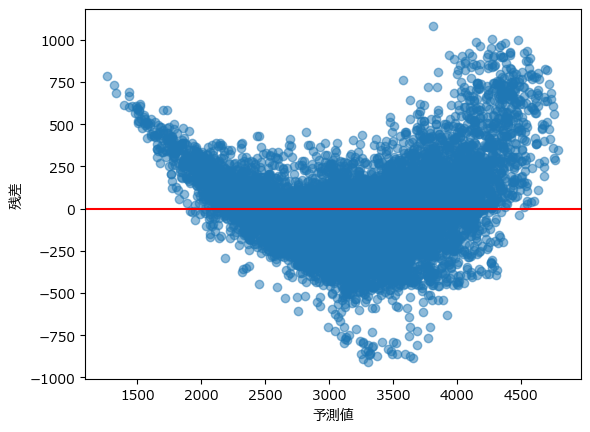

In [55]:
plt.subplot()
plt.scatter(result_4["yhat"], result_4["diff"], alpha=0.5)
plt.axhline(y=0, color='red')  # 縦軸の値が0での平行線
plt.xlabel('予測値')
plt.ylabel('残差')

- 残差が予測値に対して対称ではなく、曲線的なパターンを示していることが分かる
- 分散が予測値に応じて広がったり縮まっていることが分かる

count    8760.000000
mean       -7.240962
std       244.396800
min      -908.647936
25%      -163.033509
50%       -28.877326
75%       120.210632
max      1081.752883
Name: diff, dtype: float64


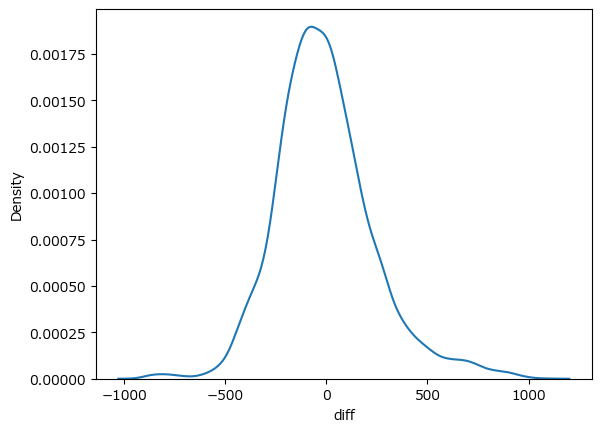

In [56]:
# カーネル密度推定
print(result_4["diff"].describe())
sns.kdeplot(result_4["diff"])
plt.show()

- また、予測値に対する残差は正規分布に近い形になっており、Prophetモデルの予測が十分に精度が高いことを示している。
- ここから残差部分をLightGBMで補正するアプローチを試みる（残差のパターンを学習し、未来のデータから推定残差を予測）
    - 1. 残差を学習データで計算
        - 過去データを用いて Prophet の予測値と実測値の差（残差）を計算。→ `result_7["residual"]`
    - 2. 残差の予測モデルを構築
        - 残差を目的変数とし、特徴量（yhat やその他の説明変数）を基に LightGBM を学習。
    - 3. 未来データで残差を予測
        - 学習済みモデルを使い、未来の yhat を入力して残差を予測。→ `future_predictions["predicted_residual"]`
    - 4. 最終予測値を計算
        - 未来の Prophet の予測値 (yhat) に LightGBM で予測した残差を加算。→ `future_predictions["final_prediction"]`

### ⑧ 説明変数に休日 + 気温（18.1度で絶対値差分）+ 残差にLightGBMモデルを適用

In [57]:
# 2016年から2023年まで（全期間）の予測値
forecast_holi_tempabs

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,extra_regressors_multiplicative,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2016-04-01 00:00:00,3230.320060,2259.530651,2859.755357,3230.320060,3230.320060,-0.155181,-0.155181,-0.155181,-0.069048,...,0.035916,0.035916,0.035916,-0.022796,-0.022796,-0.022796,0.0,0.0,0.0,2548.372256
1,2016-04-01 01:00:00,3230.281882,2214.629248,2794.299229,3230.281882,3230.281882,-0.194460,-0.194460,-0.194460,-0.043125,...,0.036057,0.036057,0.036057,-0.022679,-0.022679,-0.022679,0.0,0.0,0.0,2506.031258
2,2016-04-01 02:00:00,3230.243703,2086.833588,2681.426063,3230.243703,3230.243703,-0.216979,-0.216979,-0.216979,-0.053926,...,0.036168,0.036168,0.036168,-0.022562,-0.022562,-0.022562,0.0,0.0,0.0,2399.105501
3,2016-04-01 03:00:00,3230.205525,2117.987096,2725.734494,3230.205525,3230.205525,-0.226919,-0.226919,-0.226919,-0.036644,...,0.036236,0.036236,0.036236,-0.022446,-0.022446,-0.022446,0.0,0.0,0.0,2423.386763
4,2016-04-01 04:00:00,3230.167347,2204.690488,2773.880514,3230.167347,3230.167347,-0.222890,-0.222890,-0.222890,-0.019362,...,0.036247,0.036247,0.036247,-0.022330,-0.022330,-0.022330,0.0,0.0,0.0,2492.611056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67939,2023-12-31 19:00:00,3111.929821,2084.833565,4105.135407,2141.596162,3996.505530,0.122973,0.122973,0.122973,0.022030,...,-0.073515,-0.073515,-0.073515,-0.065761,-0.065761,-0.065761,0.0,0.0,0.0,3129.749750
67940,2023-12-31 20:00:00,3111.920676,1999.936489,3835.383459,2141.325458,3996.739564,0.089141,0.089141,0.089141,-0.016855,...,-0.068540,-0.068540,-0.068540,-0.065842,-0.065842,-0.065842,0.0,0.0,0.0,2918.682221
67941,2023-12-31 21:00:00,3111.911530,1866.581644,3639.007508,2141.054753,3996.973598,0.036975,0.036975,0.036975,-0.008214,...,-0.063385,-0.063385,-0.063385,-0.065921,-0.065921,-0.065921,0.0,0.0,0.0,2799.025859
67942,2023-12-31 22:00:00,3111.902385,1832.093124,3506.248495,2140.784049,3997.207632,-0.029201,-0.029201,-0.029201,0.024190,...,-0.058082,-0.058082,-0.058082,-0.065998,-0.065998,-0.065998,0.0,0.0,0.0,2710.184324


In [58]:
# 2016年から2023年まで（全期間）の予測値と実測値を結合
result_7 = pd.concat([forecast_holi_tempabs, data_prophet["y"]],axis=1)
result_7

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,daily,daily_lower,daily_upper,extra_regressors_multiplicative,...,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat,y
0,2016-04-01 00:00:00,3230.320060,2259.530651,2859.755357,3230.320060,3230.320060,-0.155181,-0.155181,-0.155181,-0.069048,...,0.035916,0.035916,-0.022796,-0.022796,-0.022796,0.0,0.0,0.0,2548.372256,2555
1,2016-04-01 01:00:00,3230.281882,2214.629248,2794.299229,3230.281882,3230.281882,-0.194460,-0.194460,-0.194460,-0.043125,...,0.036057,0.036057,-0.022679,-0.022679,-0.022679,0.0,0.0,0.0,2506.031258,2433
2,2016-04-01 02:00:00,3230.243703,2086.833588,2681.426063,3230.243703,3230.243703,-0.216979,-0.216979,-0.216979,-0.053926,...,0.036168,0.036168,-0.022562,-0.022562,-0.022562,0.0,0.0,0.0,2399.105501,2393
3,2016-04-01 03:00:00,3230.205525,2117.987096,2725.734494,3230.205525,3230.205525,-0.226919,-0.226919,-0.226919,-0.036644,...,0.036236,0.036236,-0.022446,-0.022446,-0.022446,0.0,0.0,0.0,2423.386763,2375
4,2016-04-01 04:00:00,3230.167347,2204.690488,2773.880514,3230.167347,3230.167347,-0.222890,-0.222890,-0.222890,-0.019362,...,0.036247,0.036247,-0.022330,-0.022330,-0.022330,0.0,0.0,0.0,2492.611056,2390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67939,2023-12-31 19:00:00,3111.929821,2084.833565,4105.135407,2141.596162,3996.505530,0.122973,0.122973,0.122973,0.022030,...,-0.073515,-0.073515,-0.065761,-0.065761,-0.065761,0.0,0.0,0.0,3129.749750,2919
67940,2023-12-31 20:00:00,3111.920676,1999.936489,3835.383459,2141.325458,3996.739564,0.089141,0.089141,0.089141,-0.016855,...,-0.068540,-0.068540,-0.065842,-0.065842,-0.065842,0.0,0.0,0.0,2918.682221,2845
67941,2023-12-31 21:00:00,3111.911530,1866.581644,3639.007508,2141.054753,3996.973598,0.036975,0.036975,0.036975,-0.008214,...,-0.063385,-0.063385,-0.065921,-0.065921,-0.065921,0.0,0.0,0.0,2799.025859,2754
67942,2023-12-31 22:00:00,3111.902385,1832.093124,3506.248495,2140.784049,3997.207632,-0.029201,-0.029201,-0.029201,0.024190,...,-0.058082,-0.058082,-0.065998,-0.065998,-0.065998,0.0,0.0,0.0,2710.184324,2647


In [59]:
# 残差を計算
result_7["residual"] = result_7["y"] - result_7["yhat"]

# トレーニングデータ（2016年～2022年）
X_train = result_7.loc[result_7["ds"] <= "2022-12-31", ["yhat", "holiday", "temperature_abs"]]
y_train = result_7.loc[result_7["ds"] <= "2022-12-31", "residual"]

# テストデータ（2023年）
X_test = result_7.loc[result_7["ds"] >= "2023-01-01", ["yhat", "holiday", "temperature_abs"]]
y_test = result_7.loc[result_7["ds"] >= "2023-01-01", "residual"]

# スライス後の形状を確認
print(f"トレーニングデータ: {X_train.shape}, {y_train.shape}")
print(f"テストデータ: {X_test.shape}, {y_test.shape}")

トレーニングデータ: (59161, 3), (59161,)
テストデータ: (8760, 3), (8760,)


- 残差が正規分布に近い形をしているため、ガウス分布を仮定した単純なモデルである線形回帰を試行し、複雑な関係を捉えられるLightGBMとで性能を比較してみたい。

In [60]:
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor

# 線形回帰モデル
lr = LinearRegression()
lr.fit(X_train, y_train)

# LightGBMモデルの学習
lgbm = LGBMRegressor(random_state=42, learning_rate=0.01, verbose=-1)
lgbm.fit(X_train, y_train)

# 線形回帰での予測
y_pred_residuals_lr = lr.predict(X_test)

# LightGBMでの予測
y_pred_residuals_lgbm = lgbm.predict(X_test)

# RMSEとR²の比較
rmse_lr = mean_squared_error(y_test, y_pred_residuals_lr, squared=False)
r2_lr = r2_score(y_test, y_pred_residuals_lr)

rmse_lgbm = mean_squared_error(y_test, y_pred_residuals_lgbm, squared=False)
r2_lgbm = r2_score(y_test, y_pred_residuals_lgbm)

print(f"線形回帰 - RMSE: {rmse_lr:.4f}, R²: {r2_lr:.4f}")
print(f"LightGBM - RMSE: {rmse_lgbm:.4f}, R²: {r2_lgbm:.4f}")

線形回帰 - RMSE: 256.5314, R²: -0.0024
LightGBM - RMSE: 215.5838, R²: 0.2921


- 残差の分布がガウス分布に近いとしても、線形回帰が失敗している理由として、残差に複雑な非線形性が含まれている可能性が高い。
- LightGBMがよい性能を出しているので、今回は残差の予測にLightGBMを使いたい。

In [61]:
# 訓練データとテストデータでの残差モデルの評価
train_rmse = mean_squared_error(y_train, lgbm.predict(X_train), squared=False)
test_rmse = mean_squared_error(y_test, lgbm.predict(X_test), squared=False)
print(f"訓練データ RMSE: {train_rmse:.4f}")
print(f"テストデータ RMSE: {test_rmse:.4f}")

訓練データ RMSE: 186.7326
テストデータ RMSE: 215.5838


In [62]:
# ⑤で作成したresult_4の中身を確認
result_4.head()

,ds,y,yhat,diff
0,2023-01-01 00:00:00,2870,2637.707447,232.292553
1,2023-01-01 01:00:00,2721,2524.546382,196.453618
2,2023-01-01 02:00:00,2636,2466.856196,169.143804
3,2023-01-01 03:00:00,2575,2415.960816,159.039184
4,2023-01-01 04:00:00,2548,2439.608108,108.391892


In [63]:
# 未来データの残差を予測
future_predictions = X_test.copy()
future_predictions["predicted_residual"] = lgbm.predict(X_test) # 残差予測はテストデータのみに適用

# 最終予測値を計算（最終予測値 = Prophetの予測値 + LightGBM の残差予測）
future_predictions["final_prediction"] = future_predictions["yhat"] + future_predictions["predicted_residual"]

# 結果確認
future_predictions[["yhat", "predicted_residual", "final_prediction"]].head()

,yhat,predicted_residual,final_prediction
59184,2627.489338,52.573112,2680.062450
59185,2515.549184,51.530462,2567.079646
59186,2458.398076,48.750715,2507.148790
59187,2408.249872,47.294209,2455.544081
59188,2431.645178,47.294209,2478.939387


In [64]:
y_actual = result_7.loc[result_7["ds"] >= "2023-01-01", "y"]  # 実測値はテストデータのみ
y_pred = future_predictions["final_prediction"]  # テストデータに対応する予測値
residuals = y_actual - y_pred

# RMSE の計算
rmse = mean_squared_error(y_actual, y_pred, squared=False)
# 決定係数 (R²) の計算
r2 = r2_score(y_actual, y_pred)
print(f"統合モデル RMSE: {rmse:.4f}")
print(f"統合モデル R²: {r2:.4f}")

統合モデル RMSE: 215.5838
統合モデル R²: 0.9083


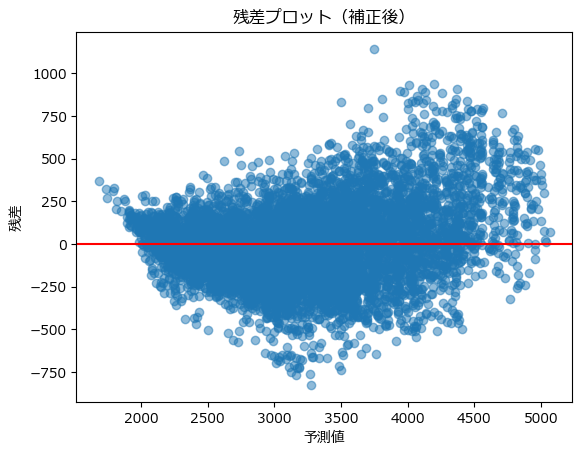

In [65]:
plt.scatter(y_pred, y_actual - y_pred, alpha=0.5)
plt.axhline(0, color='red')  # 平均ゼロの線
plt.xlabel("予測値")
plt.ylabel("残差")
plt.title("残差プロット（補正後）")
plt.show()

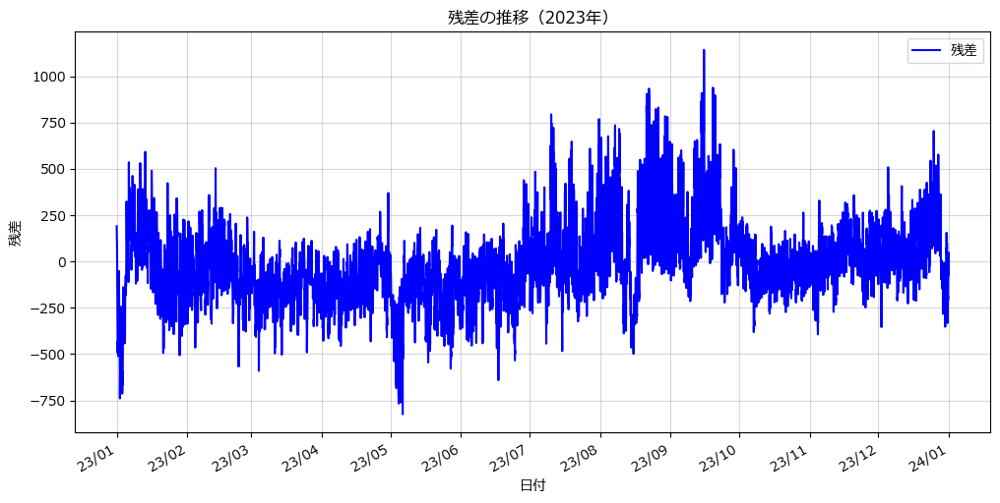

In [66]:
import matplotlib.dates as mdates
# Xとyの準備
residuals.reset_index(inplace=True, drop=True)
result_7_2023 = result_7.loc[result_7["ds"] >= "2023-01-01", "ds"].reset_index(drop=True)

# 折れ線グラフのプロット
plt.figure(figsize=(12, 6))
plt.plot(result_7_2023, residuals, label="残差", color="blue")

# 日付フォーマットの設定
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%y/%m"))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.gcf().autofmt_xdate()

# ラベルとタイトル
plt.xlabel("日付")
plt.ylabel("残差")
plt.title("残差の推移（2023年）")
plt.legend()
plt.grid(alpha=0.5)
plt.show()

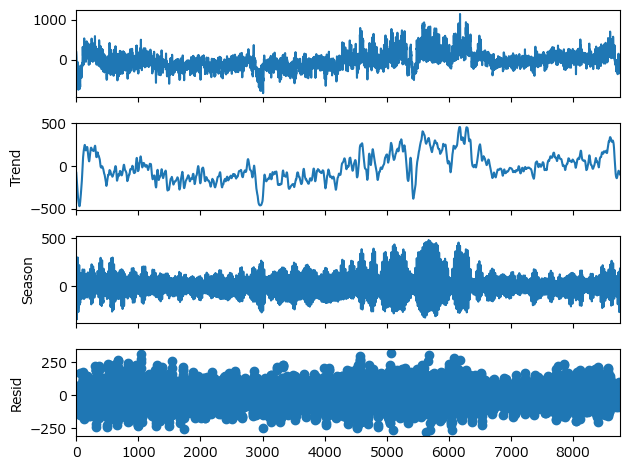

In [67]:
# 残差のSTL分解
stl = STL(residuals, period=24)
result = stl.fit()

# 分解結果を可視化
result.plot()
plt.show()

- 残差プロットが中心線（赤線）を挟んでより対称的に分布しており、Prophet単体では捉えられなかった非線形性やバイアスが補正することができたと言える
- 一方で、まだランダム性や等分散性は見られない。また、残差を時系列でプロットし、さらにSTL分解をしてみると、まだ夏から秋にかけて電力消費量が大きくなる傾向が残っていることが分かる
- ここからさらなる特徴量として、季節のカテゴリカル変数（春夏秋冬でラベルエンコーディング）なども試すことがよいかもしれない。（次回以降検討したい）
- 最後に残差を予測する説明変数「holiday」「temperature_abs」を抜くことを試してみたい。

In [68]:
# トレーニングデータ
X_train_extract = pd.DataFrame(result_7.loc[result_7["ds"] <= "2022-12-31", "yhat"])
y_train_extract = pd.DataFrame(result_7.loc[result_7["ds"] <= "2022-12-31", "residual"])

# テストデータ
X_test_extract = pd.DataFrame(result_7.loc[result_7["ds"] >= "2023-01-01", "yhat"])
y_test_extract = pd.DataFrame(result_7.loc[result_7["ds"] >= "2023-01-01", "residual"])

# スライス後の形状を確認
print(f"トレーニングデータ: {X_train_extract.shape}, {y_train_extract.shape}")
print(f"テストデータ: {X_test_extract.shape}, {y_test_extract.shape}")

トレーニングデータ: (59161, 1), (59161, 1)
テストデータ: (8760, 1), (8760, 1)


In [69]:
# LightGBMモデルの学習
lgbm = LGBMRegressor(random_state=42, learning_rate=0.01, verbose=-1)
lgbm.fit(X_train_extract, y_train_extract)

# LightGBMでの予測
y_pred_residuals_extract = lgbm.predict(X_test_extract)

rmse_lgbm = mean_squared_error(y_test_extract, y_pred_residuals_extract, squared=False)
r2_lgbm = r2_score(y_test_extract, y_pred_residuals_extract)
print(f"LightGBM - RMSE: {rmse_lgbm:.4f}, R²: {r2_lgbm:.4f}")

LightGBM - RMSE: 224.4304, R²: 0.2328


In [70]:
# 残差モデルの評価
train_rmse = mean_squared_error(y_train_extract, lgbm.predict(X_train_extract), squared=False)
test_rmse = mean_squared_error(y_test_extract, lgbm.predict(X_test_extract), squared=False)
print(f"訓練データ RMSE: {train_rmse:.4f}")
print(f"テストデータ RMSE: {test_rmse:.4f}")

訓練データ RMSE: 201.0045
テストデータ RMSE: 224.4304


In [71]:
# 未来データの残差を予測
future_predictions_extract = X_test_extract.copy()
future_predictions_extract["predicted_residual"] = lgbm.predict(X_test_extract) # 残差予測はテストデータのみに適用

# 最終予測値を計算（最終予測値 = Prophetの予測値 + LightGBM の残差予測）
future_predictions_extract["final_prediction"] = future_predictions_extract["yhat"] + future_predictions_extract["predicted_residual"]

# 結果確認
future_predictions_extract[["yhat", "predicted_residual", "final_prediction"]].head()

,yhat,predicted_residual,final_prediction
59184,2627.489338,-12.730431,2614.758907
59185,2515.549184,-2.320417,2513.228767
59186,2458.398076,19.877705,2478.275781
59187,2408.249872,22.711622,2430.961495
59188,2431.645178,22.711622,2454.356800


In [72]:
y_pred_extract = future_predictions_extract["final_prediction"]  # テストデータに対応する予測値

# RMSE の計算
rmse = mean_squared_error(y_actual, y_pred_extract, squared=False)
# 決定係数 (R²) の計算
r2 = r2_score(y_actual, y_pred_extract)
print(f"統合モデル RMSE: {rmse:.4f}")
print(f"統合モデル R²: {r2:.4f}")

統合モデル RMSE: 224.4304
統合モデル R²: 0.9006


- 残差を予測する説明変数をいれたときのほうが性能が良かった。
- よって、Prophetモデルでは、RMSE: 217.2337、R²: 0.9069が一番良い性能結果であった。

## 4.0 モデル化3 決定木系モデル

### 4.1 ランダムフォレスト回帰

- 電力消費量データは条件（気温や曜日）により容易に分岐ができるものと考え、決定木系のモデルを試行する。
- なお、ベースラインとして最初に**ランダムフォレスト回帰**を試行する。
- これから行う3つのモデルにおいては、まず引数にmax_depth = 7を設定し、その他の条件を等しくすることで公平に比較できるようにする。

In [73]:
data["year"] = data.index.year
data["month"] = data.index.month
data["hour"] = data.index.hour
data.head()

,10MW,temperature,temperature_abs,is_holiday,year,month,hour
DATETIME,,,,,,,
2016-04-01 00:00:00,2555,14.5,3.6,0,2016,4,0
2016-04-01 01:00:00,2433,13.3,4.8,0,2016,4,1
2016-04-01 02:00:00,2393,13.8,4.3,0,2016,4,2
2016-04-01 03:00:00,2375,13.0,5.1,0,2016,4,3
2016-04-01 04:00:00,2390,12.2,5.9,0,2016,4,4


In [74]:
# 目的変数(電力消費量)と説明変数の準備
y = data["10MW"]
X = data[["temperature", "temperature_abs", "is_holiday", "year", "month", "hour"]]

In [75]:
# 2016年4月〜2022年12月までを学習用、2023年1月〜2023年12月までをテスト用に分割
y_train = y["2016-04-01":"2022-12-31"]
y_test = y["2023-01-01":"2023-12-31"]

# 2016年4月〜2022年12月までを学習用、2023年1月〜2023年12月までをテスト用に分割
X_train = X["2016-04-01":"2022-12-31"]
X_test = X["2023-01-01":"2023-12-31"]

In [76]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# ランダムフォレストモデルの作成
forest = RandomForestRegressor(max_depth = 7, n_estimators=500, random_state=42)
forest.fit(X_train, y_train)

# 予測
y_train_pred = forest.predict(X_train)
y_test_pred = forest.predict(X_test)

# 精度評価
print(
    "ランダムフォレスト回帰 RMSE train: %.3f, test: %.3f"
    % (
        np.sqrt(mean_squared_error(y_train, y_train_pred)),
        np.sqrt(mean_squared_error(y_test, y_test_pred)),
    )
)
print(
    "ランダムフォレスト回帰 R^2 train: %.3f, test: %.3f"
    % (r2_score(y_train, y_train_pred), r2_score(y_test, y_test_pred))
)

ランダムフォレスト回帰 RMSE train: 233.603, test: 274.982
ランダムフォレスト回帰 R^2 train: 0.876, test: 0.851


【記録】
- `forest = RandomForestRegressor(max_depth = 7, random_state=42)`
    - ランダムフォレスト回帰 RMSE train: 245.195, test: 281.962
    - ランダムフォレスト回帰 R^2 train: 0.863, test: 0.843
- `forest = RandomForestRegressor(max_depth = 7, n_estimators=500, random_state=42)`
    - ランダムフォレスト回帰 RMSE train: 233.603, test: 274.982
    - ランダムフォレスト回帰 R^2 train: 0.876, test: 0.851
- このままだと特徴量の数が多いので重要度を取得する

Permutation Importances:
hour: 412281.0891
temperature_abs: 303834.8167
is_holiday: 65808.2959
temperature: 30832.0183
month: 4123.7128
year: 0.0000


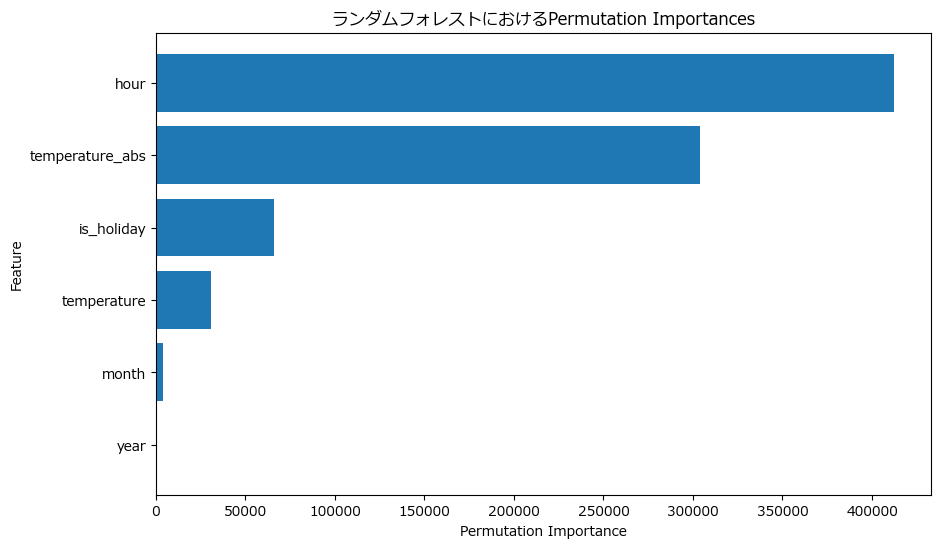

In [77]:
# permutation_importanceを使用して特徴量の重要度を計算
from sklearn.inspection import permutation_importance
result = permutation_importance(
    forest, X_test, y_test, n_repeats=10, random_state=42, scoring="neg_mean_squared_error"
)

# 特徴量の名前と重要度をペアにする
feature_names = X.columns
importances = result.importances_mean
feature_importance = sorted(
    zip(feature_names, importances), key=lambda x: x[1], reverse=True
)

# 結果を表示
print("Permutation Importances:")
for name, score in feature_importance:
    print(f"{name}: {score:.4f}")

# 特徴量重要度をプロット
plt.figure(figsize=(10, 6))
plt.barh([x[0] for x in feature_importance], [x[1] for x in feature_importance])
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("ランダムフォレストにおけるPermutation Importances")
plt.gca().invert_yaxis()
plt.show()

- 情報が重複しているtemperatureと重要度が低いmonthを削除し、特徴量をhour、temperture_abs、is_holidayに絞って実施する

In [78]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV

# 使用する変数を最初に絞り込む
X = data[["hour", "temperature_abs", "is_holiday"]]

# データ分割
X_train = X["2016-04-01":"2022-12-31"]
X_test = X["2023-01-01":"2023-12-31"]
y_train = y["2016-04-01":"2022-12-31"]
y_test = y["2023-01-01":"2023-12-31"]

# グリッドサーチのパラメータ設定
param_grid = {
    "n_estimators": [100, 300, 500],  # 決定木の個数
    "max_depth" : [7]
}

# グリッドサーチの設定
rf_model = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(
    estimator=rf_model, param_grid=param_grid, cv=5, scoring="r2", n_jobs=-1
)

# モデル学習
grid_search.fit(X_train, y_train)

# 最適なパラメータの表示
print("Best Parameters:", grid_search.best_params_)

# 最適モデルで予測
best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# 精度評価
print(
    "ランダムフォレスト回帰 RMSE train: %.3f, test: %.3f"
    % (
        np.sqrt(mean_squared_error(y_train, y_train_pred)),
        np.sqrt(mean_squared_error(y_test, y_test_pred)),
    )
)
print(
    "ランダムフォレスト回帰 R^2 train: %.3f, test: %.3f"
    % (r2_score(y_train, y_train_pred), r2_score(y_test, y_test_pred))
)

Best Parameters: {'max_depth': 7, 'n_estimators': 100}
ランダムフォレスト回帰 RMSE train: 237.916, test: 278.506
ランダムフォレスト回帰 R^2 train: 0.871, test: 0.847


- 今回は説明変数を減らさない方がうまくいった
- 決定木系のモデルは`RMSE train: 237.916, test: 278.506、R^2 train: 0.876, test: 0.851`をベースラインとしたい。

### 4.2 ヒスト勾配ブースティング回帰木（HistGradientBoostingRegressor）

- 内部で回帰木を呼び出し、特徴量の条件分岐を作成するモデル。
- 特徴量ごとのレコードの値をヒストグラムで粗くすることで、特徴量の条件分岐の計算を高速化しており、特に大きなデータセット (n_samples >= 10,000) の場合、通常のGradientBoostingRegressor よりもはるかに高速になる。

In [79]:
# 目的変数(電力消費量)と説明変数の準備
y = data["10MW"]
X = data[["temperature", "temperature_abs", "is_holiday", "month", "hour"]]

# 2016年4月〜2022年12月までを学習用、2023年1月〜2023年12月までをテスト用に分割
y_train = y["2016-04-01":"2022-12-31"]
y_test = y["2023-01-01":"2023-12-31"]

# 2016年4月〜2022年12月までを学習用、2023年1月〜2023年12月までをテスト用に分割
X_train = X["2016-04-01":"2022-12-31"]
X_test = X["2023-01-01":"2023-12-31"]

ヒスト勾配ブースティング回帰木 RMSE train: 196.511, test: 243.827
ヒスト勾配ブースティング回帰木 R^2 train: 0.912, test: 0.883
Permutation Importances:
hour: 426273.3119
temperature_abs: 240587.7195
is_holiday: 66628.1240
month: 34511.8387
temperature: 12484.2081


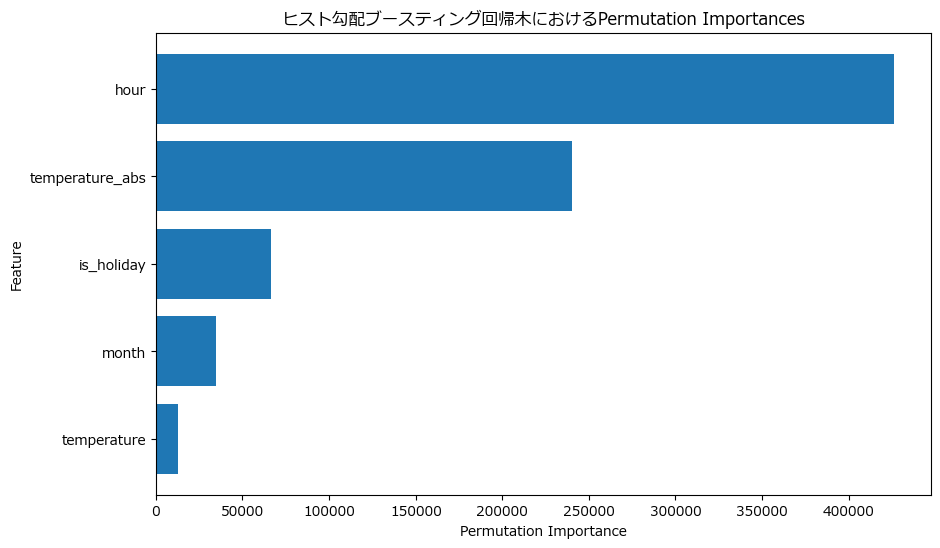

In [80]:
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt

hgb = HistGradientBoostingRegressor(max_depth = 7, random_state=42)
hgb.fit(X_train, y_train)

# 予測
y_train_pred = hgb.predict(X_train)
y_test_pred = hgb.predict(X_test)

# 精度評価
print(
    "ヒスト勾配ブースティング回帰木 RMSE train: %.3f, test: %.3f"
    % (
        np.sqrt(mean_squared_error(y_train, y_train_pred)),
        np.sqrt(mean_squared_error(y_test, y_test_pred)),
    )
)
print(
    "ヒスト勾配ブースティング回帰木 R^2 train: %.3f, test: %.3f"
    % (r2_score(y_train, y_train_pred), r2_score(y_test, y_test_pred))
)

# permutation_importanceを使用して特徴量の重要度を計算
result = permutation_importance(
    hgb, X_test, y_test, n_repeats=10, random_state=42, scoring="neg_mean_squared_error"
)

# 特徴量の名前と重要度をペアにする
feature_names = X.columns
importances = result.importances_mean
feature_importance = sorted(
    zip(feature_names, importances), key=lambda x: x[1], reverse=True
)

# 結果を表示
print("Permutation Importances:")
for name, score in feature_importance:
    print(f"{name}: {score:.4f}")

# 特徴量重要度をプロット
plt.figure(figsize=(10, 6))
plt.barh([x[0] for x in feature_importance], [x[1] for x in feature_importance])
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("ヒスト勾配ブースティング回帰木におけるPermutation Importances")
plt.gca().invert_yaxis()
plt.show()

- ランダムフォレスト回帰よりも良い性能となった。重複するtemperatureを削除しグリッドサーチを実行したい。

In [81]:
# 使用する変数を最初に絞り込む
X = data[["hour", "temperature_abs", "is_holiday", 'month']]

# データ分割
X_train = X["2016-04-01":"2022-12-31"]
X_test = X["2023-01-01":"2023-12-31"]
y_train = y["2016-04-01":"2022-12-31"]
y_test = y["2023-01-01":"2023-12-31"]

# グリッドサーチのパラメータ設定
param_grid = {
    "max_depth" : [7, 9],
    "max_iter": [500, 700],  # 決定木の個数
    "learning_rate" : [0.03, 0.04] #学習率
}

# グリッドサーチの設定
hgb = HistGradientBoostingRegressor(random_state=42)
grid_search = GridSearchCV(
    estimator=hgb, param_grid=param_grid, cv=5, scoring="r2", n_jobs=-1
)

# モデル学習
grid_search.fit(X_train, y_train)

# 最適なパラメータの表示
print("Best Parameters:", grid_search.best_params_)

# 最適モデルで予測
best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# 精度評価
print(
    "ヒスト勾配ブースティング回帰木 RMSE train: %.3f, test: %.3f"
    % (
        np.sqrt(mean_squared_error(y_train, y_train_pred)),
        np.sqrt(mean_squared_error(y_test, y_test_pred)),
    )
)
print(
    "ヒスト勾配ブースティング回帰木 R^2 train: %.3f, test: %.3f"
    % (r2_score(y_train, y_train_pred), r2_score(y_test, y_test_pred))
)

Best Parameters: {'learning_rate': 0.03, 'max_depth': 7, 'max_iter': 700}
ヒスト勾配ブースティング回帰木 RMSE train: 195.551, test: 244.559
ヒスト勾配ブースティング回帰木 R^2 train: 0.913, test: 0.882


【記録】
```
param_grid = {
    "max_depth" : [7],
    "max_iter": [100, 300, 500],  # 決定木の個数
    "learning_rate" : [0.01, 0.03] #学習率
}
Best Parameters: {'learning_rate': 0.03, 'max_depth': 7, 'max_iter': 500}
```
- ヒスト勾配ブースティング回帰木 RMSE train: 195.551, test: 244.559
- ヒスト勾配ブースティング回帰木 R^2 train: 0.913, test: 0.882
```
param_grid = {
    "max_depth" : [7],
    "max_iter": [500, 700],  # 決定木の個数
    "learning_rate" : [0.03, 0.05] #学習率
}
Best Parameters: {'learning_rate': 0.03, 'max_depth': 7, 'max_iter': 500}
```
- ヒスト勾配ブースティング回帰木 RMSE train: 195.551, test: 244.559
- ヒスト勾配ブースティング回帰木 R^2 train: 0.913, test: 0.882
```
param_grid = {
    "max_depth" : [7, 9],
    "max_iter": [500, 700],  # 決定木の個数
    "learning_rate" : [0.03, 0.04] #学習率
}
Best Parameters: {'learning_rate': 0.03, 'max_depth': 7, 'max_iter': 500}
```
- ヒスト勾配ブースティング回帰木 RMSE train: 195.551, test: 244.559
- ヒスト勾配ブースティング回帰木 R^2 train: 0.913, test: 0.882

- いろいろなパターンを試したが、ヒスト勾配ブースティング回帰木は{'learning_rate': 0.03, 'max_depth': 7, 'max_iter': 500}が一番よい結果となった。
- また、temperatureを削除する前のほうが若干性能が良いため、最後に全特徴量で{'learning_rate': 0.03, 'max_depth': 7, 'max_iter': 500}をパラメータとするパターンを試してみたい。

In [82]:
# 目的変数(電力消費量)と説明変数の準備
y = data["10MW"]
X = data[["temperature", "temperature_abs", "is_holiday", "month", "hour"]]

# 2016年4月〜2022年12月までを学習用、2023年1月〜2023年12月までをテスト用に分割
y_train = y["2016-04-01":"2022-12-31"]
y_test = y["2023-01-01":"2023-12-31"]

# 2016年4月〜2022年12月までを学習用、2023年1月〜2023年12月までをテスト用に分割
X_train = X["2016-04-01":"2022-12-31"]
X_test = X["2023-01-01":"2023-12-31"]

In [83]:
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

hgb = HistGradientBoostingRegressor(max_depth = 7, max_iter = 700, learning_rate = 0.03, random_state=42)
hgb.fit(X_train, y_train)

# 予測
y_train_pred = hgb.predict(X_train)
y_test_pred = hgb.predict(X_test)

# 精度評価
print(
    "ヒスト勾配ブースティング回帰木 RMSE train: %.3f, test: %.3f"
    % (
        np.sqrt(mean_squared_error(y_train, y_train_pred)),
        np.sqrt(mean_squared_error(y_test, y_test_pred)),
    )
)
print(
    "ヒスト勾配ブースティング回帰木 R^2 train: %.3f, test: %.3f"
    % (r2_score(y_train, y_train_pred), r2_score(y_test, y_test_pred))
)

ヒスト勾配ブースティング回帰木 RMSE train: 194.552, test: 243.940
ヒスト勾配ブースティング回帰木 R^2 train: 0.914, test: 0.883


- 今回はtemperatureを削除しないほうが予測性能が向上した。
- 最後に可視化をしたい。

In [84]:
import plotly.graph_objects as go

# グラフの作成
fig = go.Figure()

# 実測値のプロット
fig.add_trace(
    go.Scatter(
        x=y_test.index, y=y_test, mode="lines", name="実測値", line=dict(color="blue")
    )
)

# HistGradientBoostingRegressorの予測値のプロット
fig.add_trace(
    go.Scatter(
        x=y_test.index,
        y=y_test_pred,
        mode="lines",
        name="HistGradientBoosting予測",
        line=dict(color="red", dash="dash"),  # 実線を破線に設定
    )
)

# グラフのレイアウト設定
fig.update_layout(
    title="2023年の電力消費量の実測値とモデルによる予測",
    xaxis_title="日付",
    yaxis_title="電力消費量 (万kW)",
    legend_title="凡例",
    width=900,  # 幅を設定
    height=400,  # 高さを設定
)

# グラフを表示
fig.show()

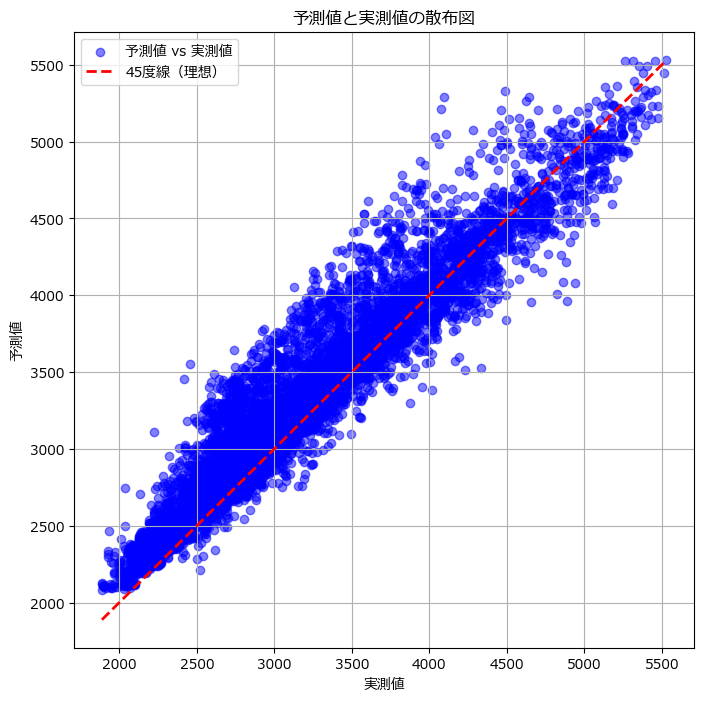

In [85]:
# 散布図をプロット
plt.figure(figsize=(8, 8))
plt.scatter(y_test, y_test_pred, alpha=0.5, color="blue", label="予測値 vs 実測値")
plt.plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    "r--",
    lw=2,
    label="45度線（理想）",
)

# グラフの詳細設定
plt.xlabel("実測値")
plt.ylabel("予測値")
plt.title("予測値と実測値の散布図")
plt.legend()
plt.grid(True)
plt.show()

- モデルの予測は周期性や季節性をよく捉えていることが分かる
- 一方で、予測値と実測値の散布図において、若干予測が上振れしていることが分かる

### 4.3 LightGBM

- ランダムフォレストとヒスト勾配ブースティング回帰木を試した結果、それぞれ一定の精度を示したが、さらなる精度向上のためには、計算効率を保ちながらもモデルの性能を引き出せるアプローチが必要である。
- LightGBM（Light Gradient Boosting Machine）は、勾配ブースティングの手法を効率的に実装したアルゴリズムで、以下の特徴を持つ。
    - Leaf-wise分岐：通常のDepth-wise（深さ方向）の分岐に比べ、Leaf-wise（葉方向）の分岐を採用することで、より少ない決定木で高い精度を実現。
    - カテゴリ変数の効率的処理：カテゴリ変数を直接扱えるため、前処理を削減でき、計算効率が向上。
    - 高速性：大規模データにおいても、高速に学習できる設計。
- ヒストグラムベースの回帰木に近いアルゴリズムであるLightGBMを試行し、既存のモデルと比較することで、さらなる精度向上と汎用性の向上を目指したい。

In [86]:
# 目的変数(電力消費量)と説明変数の準備
y = data["10MW"]
X = data[["temperature", "temperature_abs", "is_holiday", "month", "hour"]]

# 2016年4月〜2022年12月までを学習用、2023年1月〜2023年12月までをテスト用に分割
y_train = y["2016-04-01":"2022-12-31"]
y_test = y["2023-01-01":"2023-12-31"]

# 2016年4月〜2022年12月までを学習用、2023年1月〜2023年12月までをテスト用に分割
X_train = X["2016-04-01":"2022-12-31"]
X_test = X["2023-01-01":"2023-12-31"]

LightGBM RMSE train: 195.016, test: 243.375
LightGBM R^2 train: 0.913, test: 0.883
Permutation Importances:
hour: 428824.5386
temperature_abs: 226019.9286
is_holiday: 67056.0182
month: 33745.4269
temperature: 11631.5000


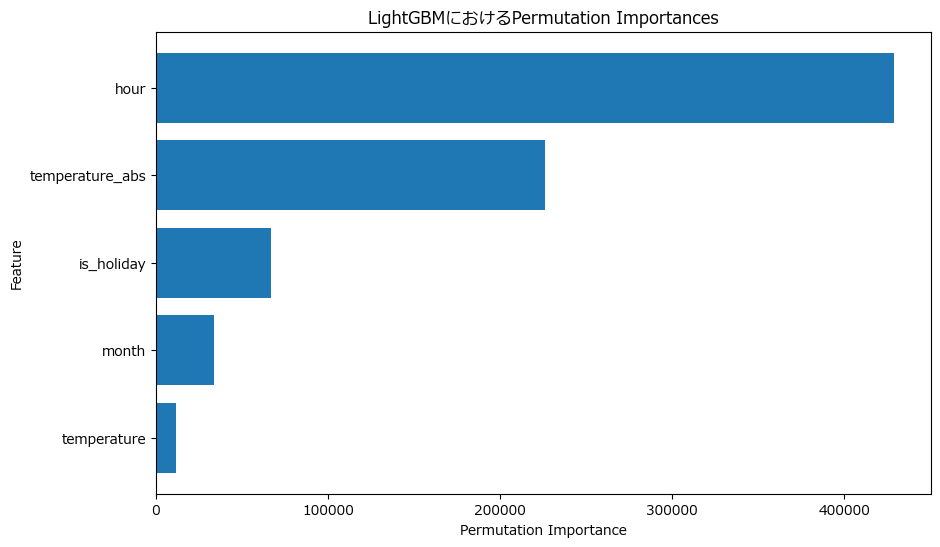

In [87]:
import lightgbm as lgb
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, r2_score

# is_holiday, month, hourをカテゴリカル型に変換
X_train["is_holiday"] = X_train["is_holiday"].astype("category")
X_train["month"] = X_train["month"].astype("category")
X_train["hour"] = X_train["hour"].astype("category")

X_test["is_holiday"] = X_test["is_holiday"].astype("category")
X_test["month"] = X_test["month"].astype("category")
X_test["hour"] = X_test["hour"].astype("category")

# LightGBMモデルの構築
lgb_model = lgb.LGBMRegressor(random_state=42, max_depth = 7, verbose=-1) #ランダムフォレストの初期値と同様
lgb_model.fit(X_train, y_train)

# 訓練データとテストデータで予測
y_train_pred = lgb_model.predict(X_train)
y_test_pred = lgb_model.predict(X_test)

# 精度評価
print(
    "LightGBM RMSE train: %.3f, test: %.3f"
    % (
        np.sqrt(mean_squared_error(y_train, y_train_pred)),
        np.sqrt(mean_squared_error(y_test, y_test_pred)),
    )
)
print(
    "LightGBM R^2 train: %.3f, test: %.3f"
    % (r2_score(y_train, y_train_pred), r2_score(y_test, y_test_pred))
)

# permutation_importanceを使用して特徴量の重要度を計算
result = permutation_importance(
    lgb_model, X_test, y_test, n_repeats=10, random_state=42, scoring="neg_mean_squared_error"
)

# 特徴量の名前と重要度をペアにする
feature_names = X_train.columns
importances = result.importances_mean
feature_importance = sorted(
    zip(feature_names, importances), key=lambda x: x[1], reverse=True
)

# 結果を表示
print("Permutation Importances:")
for name, score in feature_importance:
    print(f"{name}: {score:.4f}")

# 特徴量重要度をプロット
plt.figure(figsize=(10, 6))
plt.barh([x[0] for x in feature_importance], [x[1] for x in feature_importance])
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("LightGBMにおけるPermutation Importances")
plt.gca().invert_yaxis()
plt.show()

- ランダムフォレストとヒスト勾配ブースティング回帰木のデフォルト（引数にmax_depth = 7を設定しその他の条件を等しくする）に比べて、LightGBMが若干良い性能である。
- ここからLightGBMで精度を向上させる試みを試したい。

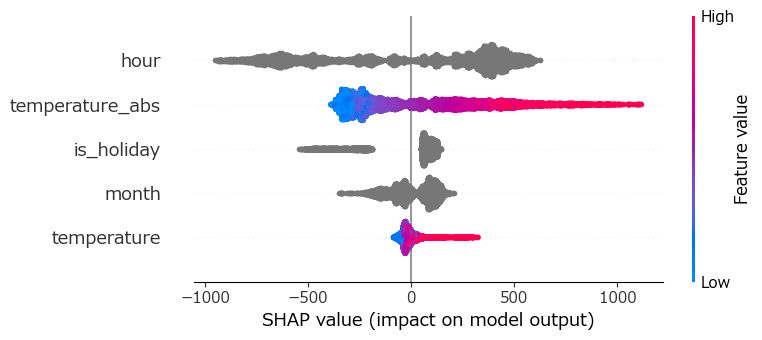

In [88]:
import shap
# SHAP Explainerを初期化
explainer = shap.TreeExplainer(lgb_model)

# SHAP値を計算
shap_values = explainer.shap_values(X_test)

# 特徴量の重要度をSHAPで可視化
# Summary plot
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test)

- SHAPで可視化を起こった結果、情報が重複しているtemperatureも予測に寄与していることが分かる
- 実際に削除する場合としない場合で性能を比較する

In [89]:
# 両方を保持する場合
lgb_model_with_both = lgb.LGBMRegressor(random_state=42)
lgb_model_with_both.fit(X_train, y_train)
y_test_pred_with_both = lgb_model_with_both.predict(X_test)

# temperature を削除
X_train_no_temp = X_train.drop(columns=['temperature'])
X_test_no_temp = X_test.drop(columns=['temperature'])
lgb_model_without_temp = lgb.LGBMRegressor(random_state=42)
lgb_model_without_temp.fit(X_train_no_temp, y_train)
y_test_pred_without_temp = lgb_model_without_temp.predict(X_test_no_temp)

# temperature_abs を削除
X_train_no_temp_abs = X_train.drop(columns=['temperature_abs'])
X_test_no_temp_abs = X_test.drop(columns=['temperature_abs'])
lgb_model_without_temp_abs = lgb.LGBMRegressor(random_state=42)
lgb_model_without_temp_abs.fit(X_train_no_temp_abs, y_train)
y_test_pred_without_temp_abs = lgb_model_without_temp_abs.predict(X_test_no_temp_abs)

# 評価
print("両方保持:")
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_test_pred_with_both)))
print("R^2:", r2_score(y_test, y_test_pred_with_both))

print("\n気温を削除:")
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_test_pred_without_temp)))
print("R^2:", r2_score(y_test, y_test_pred_without_temp))

print("\n気温の絶対値差分を削除:")
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_test_pred_without_temp_abs)))
print("R^2:", r2_score(y_test, y_test_pred_without_temp_abs))


両方保持:
RMSE: 243.5749764327954
R^2: 0.8829529142742911

気温を削除:
RMSE: 243.59245554179623
R^2: 0.8829361149116766

気温の絶対値差分を削除:
RMSE: 244.01452481246514
R^2: 0.8825300935207842


- 今回はtemperatureを削除しないほうが少しだけ性能が良くなることが分かった（どちらも重要な特徴量である）

In [90]:
# 目的変数(電力消費量)と説明変数の準備
y = data["10MW"]
X = data[["temperature", "temperature_abs", "is_holiday", "month", "hour"]]

# 2016年4月〜2022年12月までを学習用、2023年1月〜2023年12月までをテスト用に分割
y_train = y["2016-04-01":"2022-12-31"]
y_test = y["2023-01-01":"2023-12-31"]

X_train = X["2016-04-01":"2022-12-31"].copy()
X_test = X["2023-01-01":"2023-12-31"].copy()

# is_holiday, month, hourをカテゴリカル型に変換
X_train["is_holiday"] = X_train["is_holiday"].astype("category")
X_train["month"] = X_train["month"].astype("category")
X_train["hour"] = X_train["hour"].astype("category")

X_test["is_holiday"] = X_test["is_holiday"].astype("category")
X_test["month"] = X_test["month"].astype("category")
X_test["hour"] = X_test["hour"].astype("category")

# グリッドサーチのパラメータ設定
param_grid = {
    "max_depth" : [7], 
}

# グリッドサーチの設定
lgb_model = lgb.LGBMRegressor(random_state=42)
grid_search = GridSearchCV(
    estimator=lgb_model, param_grid=param_grid, cv=5, scoring="r2", n_jobs=-1
)

# モデル学習
grid_search.fit(X_train, y_train)

# 最適なパラメータの表示
print("Best Parameters:", grid_search.best_params_)

# 最適モデルで予測
best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# 精度評価
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"LightGBM RMSE train: {train_rmse:.3f}, test: {test_rmse:.3f}")
print(f"LightGBM R^2 train: {train_r2:.3f}, test: {test_r2:.3f}")

Best Parameters: {'max_depth': 7}
LightGBM RMSE train: 195.016, test: 243.375
LightGBM R^2 train: 0.913, test: 0.883


【記録】
```
param_grid = {
   "n_estimators": [300, 500],  # 決定木の個数
    "learning_rate": [0.01, 0.03],    # 学習率
    "max_depth" : [7]
}
Best Parameters: {'learning_rate': 0.03, 'max_depth': 7, 'n_estimators': 300}
```
- LightGBM RMSE train: 209.028, test: 250.349
- LightGBM R^2 train: 0.900, test: 0.876
```
param_grid = {
    "n_estimators": [200, 300],  # 決定木の個数
    "learning_rate": [0.03, 0.05],    # 学習率
    "max_depth" : [7]
Best Parameters: {'learning_rate': 0.03, 'max_depth': 7, 'n_estimators': 300}
```
- LightGBM RMSE train: 209.028, test: 250.349
- LightGBM R^2 train: 0.900, test: 0.876
```
param_grid = {
    "n_estimators": [100, 200, 300, 500],  # より広い範囲で探索
    "learning_rate": [0.01, 0.03, 0.05, 0.1],  # 幅広い学習率
    "max_depth": [5, 7, 9],  # 深さの範囲も探索
}
Best Parameters: {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 200}
```
- LightGBM RMSE train: 209.775, test: 250.663
- LightGBM R^2 train: 0.900, test: 0.876
```
param_grid = {
    "n_estimators": [100, 200, 300],  # より広い範囲で探索
    "learning_rate": [0.03, 0.05],  # 幅広い学習率
    "max_depth": [5, 7, 9],  # 深さの範囲も探索
    "num_leaves": [15, 31, 63, 127],  # 決定木の構造を細かく探索
    "subsample": [0.6, 0.8, 1.0]  # デフォルトは 1.0
}
```
- LightGBM RMSE train: 209.775, test: 250.663
- LightGBM R^2 train: 0.900, test: 0.876

- 様々なパラメータを設定し、グリッドサーチを試してみたが、max_depth = 7で全特徴量を試したときが一番性能が良かった。

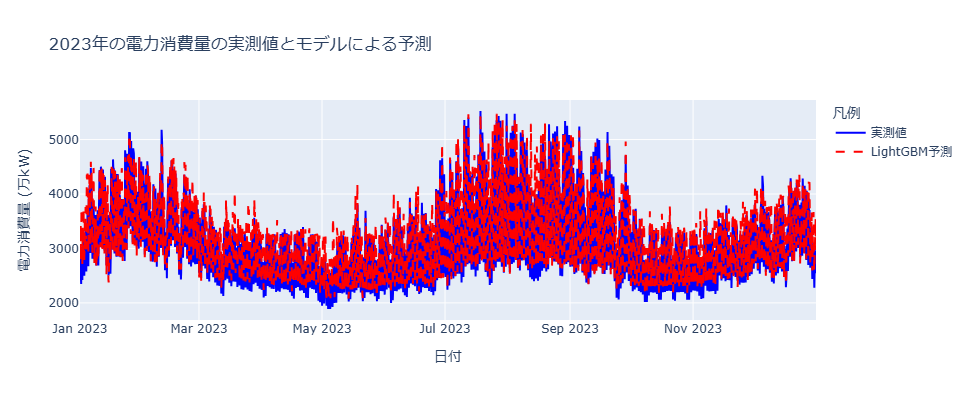

In [91]:
import plotly.graph_objects as go

# グラフの作成
fig = go.Figure()

# 実測値のプロット
fig.add_trace(
    go.Scatter(
        x=y_test.index, y=y_test, mode="lines", name="実測値", line=dict(color="blue")
    )
)

# LightGBMの予測値のプロット
fig.add_trace(
    go.Scatter(
        x=y_test.index,
        y=y_test_pred,
        mode="lines",
        name="LightGBM予測",
        line=dict(color="red", dash="dash"),  # 実線を破線に設定
    )
)

# グラフのレイアウト設定
fig.update_layout(
    title="2023年の電力消費量の実測値とモデルによる予測",
    xaxis_title="日付",
    yaxis_title="電力消費量 (万kW)",
    legend_title="凡例",
    width=900,  # 幅を設定
    height=400,  # 高さを設定
)
fig.show()

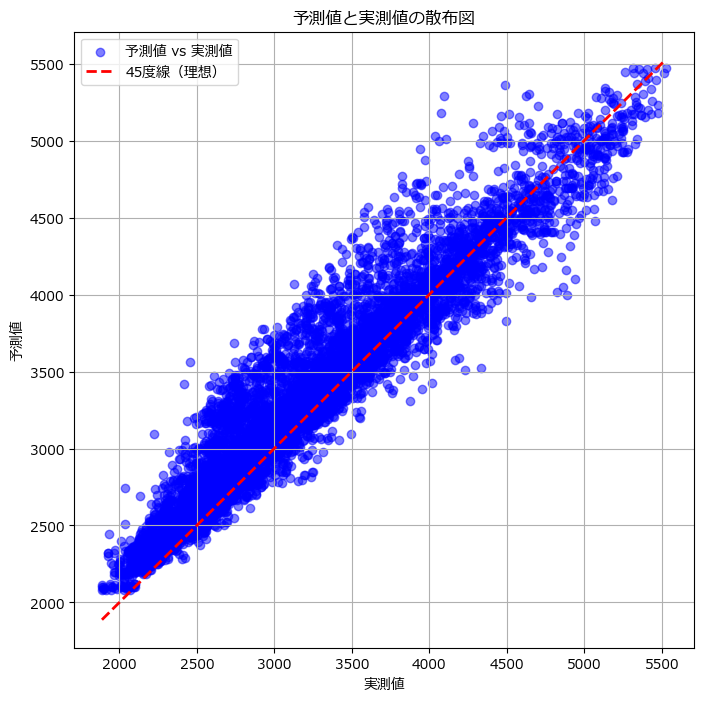

In [92]:
# 散布図をプロット
plt.figure(figsize=(8, 8))
plt.scatter(y_test, y_test_pred, alpha=0.5, color="blue", label="予測値 vs 実測値")
plt.plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    "r--",
    lw=2,
    label="45度線（理想）",
)

# グラフの詳細設定
plt.xlabel("実測値")
plt.ylabel("予測値")
plt.title("予測値と実測値の散布図")
plt.legend()
plt.grid(True)
plt.show()

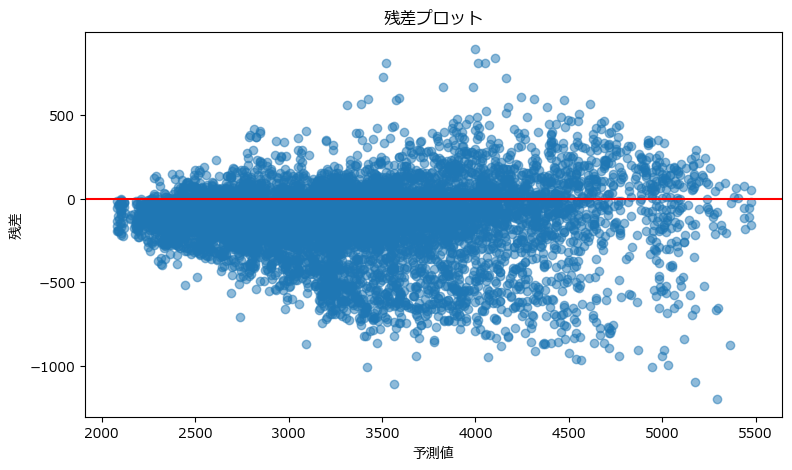

In [93]:
plt.figure(figsize=(9, 5))
plt.scatter(y_test_pred, y_test - y_test_pred, alpha=0.5)
plt.axhline(0, color='red')  # 平均ゼロの線
plt.xlabel("予測値")
plt.ylabel("残差")
plt.title("残差プロット")
plt.show()

- 平均線よりも下側のプロットが多いことから予測値が大きく出ていることが分かる。
- また、気温を説明変数にしていることから、猛暑や極寒のときに消費量が大きく増えることは予測できているが、中央の値は外れてしまっていることが分かる。
- このことをより視覚的に捉えるために気温を高温/中温/低温に分けて、プロットしてみる。

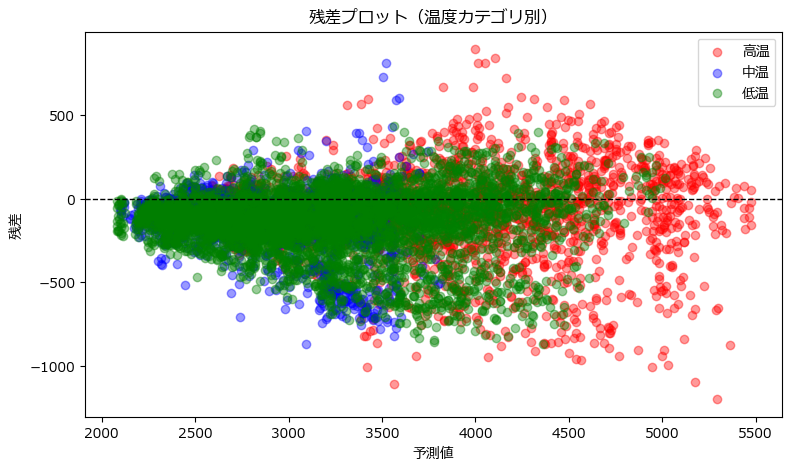

In [94]:
def categorize_temperature_manual(temp):
    if temp > 25:  # 高温（冷房をつける目安）
        return '高温'
    elif temp < 18:  # 低温（暖房をつける目安）
        return '低温'
    else:  # 快適温度帯
        return '中温'

# カテゴリ分けを適用
X_test["temp_category"] = X_test["temperature"].apply(categorize_temperature_manual)

# プロット再作成
plt.figure(figsize=(9, 5))
categories = ['高温', '中温', '低温']
colors = {'高温': 'red', '中温': 'blue', '低温': 'green'}

for category in categories:
    indices = X_test["temp_category"] == category
    plt.scatter(
        y_test_pred[indices], 
        y_test[indices] - y_test_pred[indices], 
        label=category, 
        alpha=0.4, 
        c=colors[category]
    )

plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
plt.xlabel("予測値")
plt.ylabel("残差")
plt.title("残差プロット（温度カテゴリ別）")
plt.legend()
plt.show()

- 気温カテゴリの中にも電力消費量の広がりが見られることが分かる。
- さらに休日フラグに基づいても色分けしてみる。

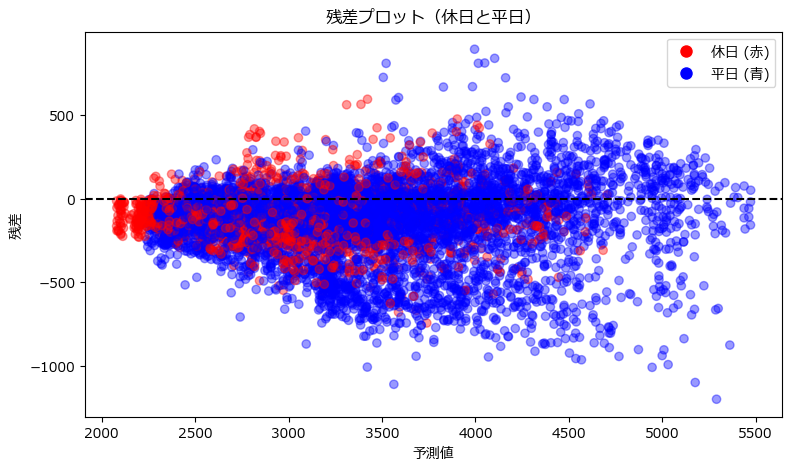

In [95]:
# 休日フラグに基づいて色を設定
colors = X_test['is_holiday'].map({1: 'red', 0: 'blue'})

# プロットの作成
plt.figure(figsize=(9, 5))

# 残差をプロット（色分けのみ）
plt.scatter(
    y_test_pred,
    y_test - y_test_pred,
    c=colors,
    alpha=0.4,
    label='休日 (赤) vs 平日 (青)'
)

# グラフの設定
plt.axhline(0, color='black', linestyle='dashed')
plt.xlabel('予測値')
plt.ylabel('残差')
plt.title('残差プロット（休日と平日）')
plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', label='休日 (赤)', markerfacecolor='red', markersize=10),
    plt.Line2D([0], [0], marker='o', color='w', label='平日 (青)', markerfacecolor='blue', markersize=10)
])
plt.show()

- 休日よりも平日の残差の広がりが大きいことが分かる。
- 以上の残差プロットを通して、LightGBMでは説明できない要素があることが分かり、湿度、降水量等の説明要因の可能性を感じられた

### 精度表

- 今回試行したモデルの結果を下表にまとめる



| モデル名                                   | 処理・工夫                                      | RMSE      | R²        | 備考                                                                                     |
|-------------------------------------------|-----------------------------------------------|-----------|-----------|------------------------------------------------------------------------------------------|
| AR                                        | -                                             | 639.269   | 0.194     |                                                                                          |
| AR                                        | STL分解を適用                                 | 615.935   | 0.252     |                                                                                          |
| Prophet                                   | -                                             | 374.312   | 0.724     |                                                                                          |
| Prophet                                   | 説明変数に休日を追加                          | 365.996   | 0.736     |                                                                                          |
| Prophet                                   | 説明変数に気温を追加                          | 375.826   | 0.721     |                                                                                          |
| Prophet                                   | 説明変数に気温と休日を追加                    | 366.073   | 0.736     |                                                                                          |
| Prophet                                   | 説明変数に気温の絶対値差分と休日を追加         | 244.490   | 0.882     |                                                                                          |
| Prophet                                   | 説明変数に閾値の二値と休日を追加              | 363.101   | 0.740     |                                                                                          |
| Prophet                                   | 説明変数に気温の絶対値差分と休日を追加　　　　 | 256.465   | 0.870     | パラメータ調整済み                                                                       |
| Prophet                                   | 説明変数に気温の絶対値差分と休日を追加<br/>**残差にLightGBM適用**      | **215.584** | **0.908** | **最良の性能**                                                                          |
| ランダムフォレスト                         | 全特徴量使用                                             | 274.982   | 0.851     |                                                                                          |
| ランダムフォレスト                         | temperatureを削除            | 278.506   | 0.847     | パラメータ調整済み                                                                       |
| ヒスト勾配ブースティング回帰木             | 全特徴量使用                                  | 243.827   | 0.883     |                                                                                         |
| ヒスト勾配ブースティング回帰木             | temperatureを削除           | 244.559   | 0.882     | パラメータ調整済み
| ヒスト勾配ブースティング回帰木             | 全特徴量使用                | 243.827   | 0.883     |                                                                     |
| LightGBM                                  | 全特徴量使用                                  | 243.375   | 0.883     |                                                                                          |
| LightGBM                                  | 全特徴量使用        | 243.375   | 0.883     | パラメータ調整済み                                                                       |

## 5.0 まとめ

### 結論

- 今回は、時系列分析モデル、Prophetモデル、決定木系モデルを比較検証し、最も性能が良かったのはProphetモデルに休日フラグと気温の絶対値差分を追加し、さらに残差にLightGBMを適用する手法であった（スタッキングの一部とも解釈可能）。
- この結果の背景として、Prophetモデルがトレンドや季節要因を自動的に捕捉する能力を発揮し、さらにトレンドや季節要因を除いた非線形の残差をLightGBMが効果的に捉えたことが精度向上につながったと考えられる。
- 一方で、今回用いた説明変数（気温と休日）だけでは、電力使用量の全てを予測するには不十分であり、湿度や降水量などの気象要因や、新たな社会的要因を説明変数として加えることで、さらなる改善が期待できる。
- また、現状の手法ではさらなる非線形性の捉え方や長期依存性を十分に扱えていない可能性があるため、次のステップとして以下を試したい。
    - RNN（再帰型ニューラルネットワーク）やLSTM（長短期記憶）の導入により、時系列データの長期的な傾向を考慮した予測を行う。
    - 深層学習を活用したモデルを用いることで、複雑な要因間の相互作用をより正確に捉える。
    - 参考論文
        - [電力使用量予測のための深層学習手法（福井大学）](chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://www.eng.u-fukui.ac.jp/wp-content/uploads/vol70_29-36.pdf)
        - [再帰型ニューラルネットワークを用いた電力需要予測の比較検討（明治大学）](chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/https://www.jstage.jst.go.jp/article/pjsai/JSAI2022/0/JSAI2022_2D6GS205/_pdf/-char/ja)

以上